In [1]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from tqdm._tqdm_notebook import tqdm_notebook
from sklearn.preprocessing import StandardScaler, RobustScaler, QuantileTransformer
pd.set_option("max_columns", 1000)
pd.set_option("max_rows", 200)
import sys
sys.path.append('../input/multilabelstraifier/')
from ml_stratifiers import MultilabelStratifiedKFold
from sklearn.model_selection import KFold

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
  


In [2]:
DIR = "/kaggle/input/lish-moa/"
train_feat = pd.read_csv(DIR+"train_features.csv")
test_feat = pd.read_csv(DIR+"test_features.csv")
train_nonscore = pd.read_csv(DIR+"train_targets_nonscored.csv")
train_score = pd.read_csv(DIR+"train_targets_scored.csv")
sub = pd.read_csv(DIR+"sample_submission.csv")
drug = pd.read_csv('/kaggle/input/lish-moa/train_drug.csv')

In [3]:
#train_feat.at[train_feat['cp_type'].str.contains('ctl_vehicle'),train_feat.filter(regex='-.*').columns] = 0.0
#test_feat.at[test_feat['cp_type'].str.contains('ctl_vehicle'),test_feat.filter(regex='-.*').columns] = 0.0

In [4]:
noncons_train_index = train_feat[train_feat.cp_type=="ctl_vehicle"].index
cons_train_index = train_feat[train_feat.cp_type!="ctl_vehicle"].index
noncons_test_index = test_feat[test_feat.cp_type=="ctl_vehicle"].index
cons_test_index = test_feat[test_feat.cp_type!="ctl_vehicle"].index

In [5]:
np.all(train_score.sig_id == drug.sig_id)

True

# non-positive target pair

In [6]:
train_score.head()

,sig_id,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhib

In [7]:
train_score.shape

(23814, 207)

In [8]:
def make_string(row):
    return str(row[1:].values).replace('[','').replace(']','').replace('\n','').replace(' ','')

train_score["target_pair"] = train_score.apply(make_string, axis=1)

In [9]:
train_score["target_pair"].nunique()

328

In [10]:
targetpair_id = dict(enumerate(train_score["target_pair"].unique()))
targetpair_id 

{0: '00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000',
 1: '00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000',
 2: '00000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000000100000000000000000000000000000000000000000000000000000000',
 3: '00000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000',
 4: '0000000000000000000000000000000000000000000000000000000000000001000000000000000000000000000000000000000000000000000000000000000000000000000

In [11]:
id_targetpair = {y:x for x,y in targetpair_id.items()}
id_targetpair

{'00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000': 0,
 '00000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000': 1,
 '00000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000000100000000000000000000000000000000000000000000000000000000': 2,
 '00000000000000000000000000000000000000000000000000000010000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000': 3,
 '0000000000000000000000000000000000000000000000000000000000000001000000000000000000000000000000000000000000000000000000000000000000000000000000

# target sum 0 vs non 0

In [12]:
target_feats = [i for i in train_score.columns if i != "sig_id"]
train_feat["sum_of_moa"] = train_score[target_feats].sum(axis=1)

In [13]:
mod_train = train_feat.loc[train_feat.index.isin(cons_train_index)].copy().reset_index(drop=True)

In [14]:
mod_train = mod_train.drop(["sig_id", "cp_type", "cp_time", "cp_dose"], axis=1)

In [15]:
mod_train_z = mod_train[mod_train.sum_of_moa ==0].copy().reset_index(drop=True)
mod_train_nonz = mod_train[mod_train.sum_of_moa !=0].copy().reset_index(drop=True)

In [16]:
print((mod_train_z == 10).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))
print((mod_train_nonz == 10).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))

8.551742547347258e-05
0.0009507705196390004


In [17]:
print((mod_train_z == -10).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))
print((mod_train_nonz == -10).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))

0.00021547337025548178
0.0034691059901444223


In [18]:
print((np.array(mod_train_z) > 9).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))
print((np.array(mod_train_nonz) > 9).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))

0.00017302007689543646
0.0018163290331812193


In [19]:
print((np.array(mod_train_z) < -9).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))
print((np.array(mod_train_nonz) < -9).sum().sum() / (mod_train_z.shape[0] * mod_train_z.shape[1]))

0.0006546664339371017
0.008608397841723433


# ctl vs non ctl

In [20]:
nonctl = train_feat.loc[cons_train_index,:].copy()
ctl = train_feat.loc[noncons_train_index,:].copy()

In [21]:
test_nonctl = test_feat.loc[cons_test_index,:].copy()
test_ctl = test_feat.loc[noncons_test_index,:].copy()

In [22]:
nonctl.shape, ctl.shape, test_nonctl.shape, test_ctl.shape

((21948, 877), (1866, 877), (3624, 876), (358, 876))

In [23]:
len(drug.drug_id.unique())

3289

In [24]:
nonctl = nonctl.merge(train_score, on="sig_id", how="left")

In [25]:
target_feats = [i for i in train_score.columns if i != "sig_id"]

In [26]:
# ラベルの組み合わせは何パターンあるのか: 328パターンで少ない。
def concat_label(row):
    ans = ""
    for i in target_feats:
        ans += str(row[i])
    return ans
nonctl["label_pattern"] = nonctl[target_feats].apply(lambda x: concat_label(x), axis=1)

In [27]:
nonctl = nonctl.merge(drug, on="sig_id", how="left")

In [28]:
len(nonctl["label_pattern"].unique())

328

In [29]:
len(nonctl.drug_id.unique())

3288

In [30]:
label_pattern = list(nonctl["label_pattern"].unique())
for label in label_pattern:
    if nonctl[nonctl.label_pattern == label].shape[0] <6:
        print(label, len(nonctl[nonctl.label_pattern == label].drug_id.unique()), nonctl[nonctl.label_pattern == label].shape[0],
          nonctl[nonctl.label_pattern == label].drug_id.unique())
# label_pattern0の患者は42例でdrugは7種類.１つのドラッグが6患者に投与されているのと辻褄があう。
# 薬が違っても示されるMOAのパターンが同じということがありうる
# やはり6患者文のデータがないMOAが気になる。これらをうまく学習できればスコア改善できるはずだが、、、、

0000000000000000000000000000000000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000 1 1 ['b01cf573a']
0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000100000000000000000000000000000010000000000000000000000000000010000000000000000000100000000000000000000000000000000100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001000000000000000000000000000000100000000000000000000000000000100000000000000000001000000000000000000000000000000001000 1 1 ['809527b9d']
000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000

In [31]:
drugs = ['b01cf573a', '809527b9d', 'fe6105bde', 'fb8a93a83', 'f0d1b8dbc', '1a038f0f7']
nonctl[nonctl.drug_id.isin(drugs)]
# 外して学習させてみたが、ローカルで悪化したので、単純に特徴量設計が悪いと思われる。

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,...,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-683,g-684,g-685,g-686,g-687,g-688,g-689,g-690,g-691,g-692,g-693,g-694,g-695,g-696,g-697,g-698,g-699,g-700,g-701,g-702,g-703,g-704,g-705,g-706,g-707,g-708,g-709,g-710,g-711,g-712,g-713,g-714,g-715,g-716,g-717,g-718,g-719,g-720,g-721,g-722,g-723,g-724,g-725,g-726,g-727,g-728,g-729,g-730,g-731,g-732,g-733,g-734,g-735,g-736,g-737,g-738,g-739,g-740,g-741,g-742,g-743,g-744,g-745,g-746,g-747,g-748,g-749,g-750,g-751,g-752,g-753,g-754,g-755,g-756,g-757,g-758,g-759,g-760,g-761,g-762,g-763,g-764,

In [32]:
ctl[(ctl.cp_time==48) & (ctl.cp_dose=="D1")]

sig_id      cp_type  cp_time cp_dose     g-0     g-1     g-2  \
25     id_0054388ec  ctl_vehicle       48      D1 -0.6696 -0.2718 -1.2230   
148    id_01b05de6c  ctl_vehicle       48      D1 -0.3176  0.8375 -0.3773   
186    id_020ba48d9  ctl_vehicle       48      D1  0.8094 -0.3339  1.1130   
271    id_02c93b4a5  ctl_vehicle       48      D1 -0.0884 -1.5410  0.5562   
347    id_03bc6d412  ctl_vehicle       48      D1  0.8431  0.0931 -0.0958   
...             ...          ...      ...     ...     ...     ...     ...   
23369  id_fb208bee2  ctl_vehicle       48      D1  0.6310 -1.0520  0.4803   
23470  id_fc43bf97f  ctl_vehicle       48      D1  0.6301  0.7315 -0.2827   
23526  id_fcdf10747  ctl_vehicle       48      D1 -0.0218 -0.2268  0.7809   
23612  id_fdad8021f  ctl_vehicle       48      D1  0.5996  0.7892  0.1271   
23656  id_fe33cc325  ctl_vehicle       48      D1  1.1120 -0.5664  1.7510   

          g-3     g-4     g-5     g-6     g-7     g-8     g-9    g-10    g-11  \
25    -0.6226 -0.7220  0.1588  0.7785  0.7062 -0.7951  1.3770  0.2856 -0.8331   
148    0.5555 -0.4877  0.3413 -0.8204 -1.1320  1.0220  2.8340  1.5950 -0.4357   
186   -0.4192  0.4545 -0.4771  1.0850  0.8575  0.0731  0.3261 -0.8354  0.6105   
271    0.4661 -0.1683  0.9515  0.5095 -1.0030  0.7616 -0.0450  0.8976  0.5340   
347   -0.4337  1.0690 -0.6440  0.2063  0.7966 -0.1971  0.1745 -0.5076  0.3780   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
23369  0.1627 -0.1636  0.7964  1.4170  0.0691 -1.0420 -0.0687 -1.5300 -1.2180   
23470 -0.3302 -0.5244 -0.0005  1.8490 -0.3246  1.1700  0.8701  0.7497 -1.1790   
23526 -0.5466  0.3386  1.4970  1.0690  0.6751  0.4247  0.2670 -0.5432 -0.9112   
23612 -0.8475  1.9180 -0.5051  1.9530  1.3240 -0.9931 -0.4122 -0.7430  0.9575   
23656  0.0985 -1.6200  1.8140  1.2400 -0.1687  1.4260  0.5600  1.8330 -1.5080   

         g-12    g-13    g-14    g-15    g-16    g-17    g-18    g-19    g-20  \
25     0.3879  1.3290 -0.4746  0.0857 -0.2745 -0.1093  0.2603  0.7386 -0.6665   
148    2.4850  0.0169  0.3497  0.2446  0.9030  1.0480 -0.0236  0.1287 -0.2542   
186    0.9817 -0.8174  0.9794 -1.1220  0.0950  0.0312  0.0000  0.9100  0.5541   
271    0.8479 -0.1927  0.2563 -0.2668  0.5639  0.8197 -0.1720  0.0382  0.0249   
347    0.2870 -0.6213  0.3087  0.7351 -0.0602 -0.5847  0.1123  0.5021  0.5723   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
23369  3.1020 -0.1955  0.9562 -0.5379  0.5156 -1.2790 -0.1865  0.8875  1.3880   
23470  1.9490 -1.8670 -1.5270 -0.3275 -0.9176 -0.0319 -0.0742 -0.4004 -0.4203   
23526  0.7015 -0.2792 -0.7013 -0.3426 -0.1716  0.9403  0.2401 -0.0357  0.8661   
23612  0.8651 -1.3710 -0.4435 -0.1386 -0.4122 -0.5756  0.6138 -1.0330 -0.6345   
23656  1.9680  0.0373  1.0800 -0.7561 -0.5768  1.2950  0.2179 -0.3066  0.7287   

         g-21    g-22    g-23    g-24    g-25    g-26    g-27    g-28    g-29  \
25    -1.6520 -0.9262  0.0000  1.6310 -0.2933  0.2043 -2.2070  0.1383 -0.4966   
148   -0.9599 -1.2090  0.8248  1.2270  0.9403  1.2220  0.7952  0.0654  0.1419   
186   -0.0226  0.1048  0.0000  1.4590  0.1450 -0.4427 -1.3700  0.2603 -0.7548   
271    0.2084  0.0435  0.3855  0.7012  0.9375  1.6060  0.5083  0.0893 -1.2330   
347    0.2225  0.3108  0.0000  1.0100  0.1671 -0.2367 -0.2497 -0.2070 -0.5006   
...       ...     ...     ...     ...     ...     ...     ...     ...     ...   
23369 -0.5777  0.6353 -2.0120  0.0322  0.9513 -0.3889 -0.2158  1.3740  1.2050   
23470  0.4864  0.0089  0.0000 -1.5730  0.1890 -1.3770 -0.8684  1.1140  1.7210   
23526  1.2070 -1.4500  0.0000  1.1530  0.2672  0.4961 -1.1400  0.7642 -0.3417   
23612  1.3210 -0.6139 -1.5840 -1.0150 -0.2096 -0.0921 -0.7579  0.2014 -0.0646   
23656  0.4448 -0.1627  0.6745  0.2043  0.3273  0.7656  0.1120  0.4100 -0.1636   

         g-30    g-31    g-32    g-33    g-34    g-35    g-36    g-37    g-38  \
25     0.6922 -0.4077  0.2303 -0.0456 -0.7447 -0.7060 -0.8653  0.0799 -0.6794   
148    

# submission correlation

# drug

In [33]:
# remove ctl_vehicle data at first
train_feat = train_feat[train_feat.index.isin(cons_train_index)].reset_index(drop=True)
test_feat = test_feat[test_feat.index.isin(cons_test_index)].reset_index(drop=True)
train_nonscore = train_nonscore[train_nonscore.index.isin(cons_train_index)].reset_index(drop=True)
train_score = train_score[train_score.index.isin(cons_train_index)].reset_index(drop=True)
#drug = drug[drug.index.isin(cons_train_index)].reset_index(drop=True)

In [34]:
all_targets = train_score.merge(train_nonscore, on="sig_id", how="left")

In [35]:
drug.head()

,sig_id,drug_id
0,id_000644bb2,b68db1d53
1,id_000779bfc,df89a8e5a
2,id_000a6266a,18bb41b2c
3,id_0015fd391,8c7f86626
4,id_001626bd3,7cbed3131


In [36]:
drug.drug_id.value_counts()

cacb2b860    1866
87d714366     718
9f80f3f77     246
8b87a7a83     203
5628cb3ee     202
             ... 
809527b9d       1
f2cc15da6       1
f5487e91f       1
ef4e67d99       1
6ec93d617       1
Name: drug_id, Length: 3289, dtype: int64

In [37]:
len(drug.drug_id.unique())

3289

In [38]:
score_drug = train_score.merge(drug, on="sig_id", how="left")
allscore_drug = all_targets.merge(drug, on="sig_id", how="left")

In [39]:
tmp = pd.DataFrame(score_drug.drug_id.value_counts().reset_index(drop=False)).copy()
tmp[tmp.drug_id==5].shape, tmp[tmp.drug_id==4].shape, tmp[tmp.drug_id==3].shape, tmp[tmp.drug_id==2].shape, tmp[tmp.drug_id==1].shape

((66, 2), (3, 2), (2, 2), (3, 2), (129, 2))

In [40]:
score_drug.drug_id.isnull().sum()

0

In [41]:
tmp = pd.DataFrame(allscore_drug.drug_id.value_counts().reset_index(drop=False)).copy()
tmp[tmp.drug_id==5].shape, tmp[tmp.drug_id==4].shape, tmp[tmp.drug_id==3].shape, tmp[tmp.drug_id==2].shape, tmp[tmp.drug_id==1].shape

((66, 2), (3, 2), (2, 2), (3, 2), (129, 2))

In [42]:
plt.figure(figsize=(20,8))
score_drug.drug_id.value_counts().head(50)#.reset_index(drop=False).plot(kind="bar")

87d714366    718
9f80f3f77    246
8b87a7a83    203
5628cb3ee    202
d08af5d4b    196
292ab2c28    194
d50f18348    186
d1b47f29d    178
67c879e79     19
83a9ea167     18
d488d031d     18
52d1e6f43     18
6b8b675cc     14
11f66c124     14
5d9bb0ebe     14
30aa2f709     14
a7c2673c1     14
1a52478dc     14
fd4387eac     13
aa7b9f4cc     13
1d3112471     13
d149a15f5     13
1d4c91026     13
d3ff26fc7     13
8c91d6909     13
0b1ed98a0     13
b3031b373     13
61155e673     13
10dbb5b2a     13
af12e2904     13
bb3b7c7d5     13
3ff075492     13
f92989f8d     13
ab50adc64     13
a44e72ca3     13
e0cd5c091     13
88c37c66a     13
02ae89796     13
03b09563c     13
20a3c3f90     13
2f5b9b3bd     13
5a518a0f0     13
1d6d22a71     13
8ed81dd51     12
20c9d8e5c     12
404e713a8     12
24c787f29     12
8bfccb68b     12
4a65421e6     12
e66896455     12
Name: drug_id, dtype: int64

<Figure size 1440x576 with 0 Axes>

# new validation

In [43]:
# https://www.kaggle.com/c/lish-moa/discussion/195195
def make_folds(num_splits, seed, train_score, drug):
    folds = []
    
    # LOAD FILES
    targets = train_score.columns[1:]
    train_score = train_score.merge(drug, on='sig_id', how='left') 

    # LOCATE DRUGS
    vc = train_score.drug_id.value_counts()
    vc1 = vc.loc[(vc==6)|(vc==12)|(vc==18)].index.sort_values()
    vc2 = vc.loc[(vc!=6)&(vc!=12)&(vc!=18)].index.sort_values()

    # STRATIFY DRUGS 18X OR LESS
    dct1 = {}; dct2 = {}
    skf = KFold(n_splits = num_splits, shuffle = True, random_state = seed) #MultilabelStratifiedKFold
    tmp = train_score.groupby('drug_id')[targets].mean().loc[vc1]
    for fold,(idxT,idxV) in enumerate(skf.split(tmp,tmp[targets])):
        dd = {k:fold for k in tmp.index[idxV].values}
        dct1.update(dd)

    # STRATIFY DRUGS MORE THAN 18X
    skf = KFold(n_splits = num_splits, shuffle = True, random_state = seed)
    tmp = train_score.loc[train_score.drug_id.isin(vc2)].reset_index(drop = True)
    for fold,(idxT,idxV) in enumerate(skf.split(tmp,tmp[targets])):
        dd = {k:fold for k in tmp.sig_id[idxV].values}
        dct2.update(dd)

    # ASSIGN FOLDS
    train_score['fold'] = train_score.drug_id.map(dct1)
    train_score.loc[train_score.fold.isna(),'fold'] =\
        train_score.loc[train_score.fold.isna(),'sig_id'].map(dct2)
    train_score.fold = train_score.fold.astype('int8')
    folds.append(train_score.fold.values)
    
    return np.array(folds)

In [44]:
folds = make_folds(7,34,train_score,drug).reshape(-1,1)
nonctl["fold"] = folds

KeyError: "['target_pair'] not in index"

In [45]:
nonctl[nonctl.fold==2]["label_pattern"].value_counts()

AttributeError: 'DataFrame' object has no attribute 'fold'

In [46]:
#target_feats = [i for i in train_score.columns if i != "sig_id"]

#for seed in range(100):
#    folds = make_folds(5, seed, train_score, drug)

#    check_dist = train_score.copy()
#    check_dist["fold"] = np.array(folds).reshape(-1,1)

#    count = 0
#    for i in target_feats:
#        if np.max(check_dist.loc[:,[i]+["fold"]].groupby("fold").sum()).values[0] == check_dist[i].sum() and check_dist[i].sum()>=5:
            #print(i)
#            count += 1
#    print(seed, count)

# check good stratification

In [47]:
def calculate_metric(data, seed, n_splits):
    diff_mean = []
    Fold = MultilabelStratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    for n, (train_index, val_index) in enumerate(Fold.split(data, data)):
        train_mean_positivity = data.iloc[train_index, 1:].mean()
        val_mean_positivity = data.iloc[val_index, 1:].mean()
        diff = train_mean_positivity - val_mean_positivity
        diff_mean += [np.sqrt(np.sum(diff**2.))]
    mn = np.mean(diff_mean)
    std = np.std(diff_mean)
    return i, mn, std

In [48]:
# all data
y_develop = train_score.set_index('sig_id').copy()
a = []
for i in range(100):
    a += [calculate_metric(y_develop, i, 5)]
    
pd.DataFrame(a, columns=['Seed', 'mean', 'std']).sort_values(by='std').set_index('Seed')

,mean,std
Seed,,
14,0.001659,0.000015
16,0.001660,0.000020
77,0.001671,0.000021
76,0.001669,0.000023
34,0.001660,0.000024
88,0.001662,0.000027
30,0.001670,0.000027
32,0.001659,0.000027
51,0.001661,0.000031


In [49]:
# data with more than 18
y_develop = train_score.merge(drug, on='sig_id', how='left')

# LOCATE DRUGS
vc = y_develop.drug_id.value_counts()
vc1 = vc.loc[vc <= 18].index.sort_values()
vc2 = vc.loc[vc > 18].index.sort_values()

tmp = y_develop.loc[y_develop.drug_id.isin(vc2)].reset_index(drop = True).drop("drug_id", axis=1)

a = []
for i in range(100):
    a += [calculate_metric(tmp, i, 5)]
    
pd.DataFrame(a, columns=['Seed', 'mean', 'std']).sort_values(by='std').set_index('Seed')

,mean,std
Seed,,
16,0.004379,0.000253
18,0.004371,0.000358
90,0.004367,0.000407
1,0.004364,0.000439
21,0.004413,0.000512
50,0.004393,0.000515
19,0.004389,0.000547
60,0.004412,0.000557
6,0.004636,0.000587


# overview

In [50]:
train_feat.shape

(21948, 877)

In [51]:
train_feat.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-67

In [52]:
set(train_feat.sig_id.unique()) == set(train_score.sig_id.unique())

True

In [53]:
set(test_feat.columns) == set(train_feat.columns)

False

In [54]:
train_feat.describe()

,cp_time,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-6

In [55]:
test_feat.describe()

,cp_time,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-6

In [56]:
# missing values
print(train_feat.isnull().sum().sum())
print(test_feat.isnull().sum().sum())
print(train_score.isnull().sum().sum())
print(train_nonscore.isnull().sum().sum())

0
0
0
0


# cp variables

In [57]:
cp_feats = [i for i in train_feat.columns if "cp_" in i]
print(cp_feats)

['cp_type', 'cp_time', 'cp_dose']


[24 72 48]
[24 72 48]


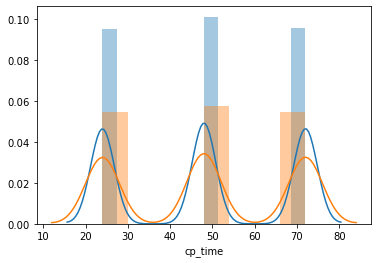

In [58]:
# cp_time: treatment duration
print(train_feat["cp_time"].unique())
print(test_feat["cp_time"].unique())
sns.distplot(train_feat["cp_time"])
sns.distplot(test_feat["cp_time"])

In [59]:
# cp_dose: dose (high or low)
print(train_feat["cp_dose"].value_counts())
print(train_feat["cp_dose"].value_counts(normalize=True))
print("#############")
print(test_feat["cp_dose"].value_counts())
print(test_feat["cp_dose"].value_counts(normalize=True))

D1    11196
D2    10752
Name: cp_dose, dtype: int64
D1    0.510115
D2    0.489885
Name: cp_dose, dtype: float64
#############
D1    1845
D2    1779
Name: cp_dose, dtype: int64
D1    0.509106
D2    0.490894
Name: cp_dose, dtype: float64


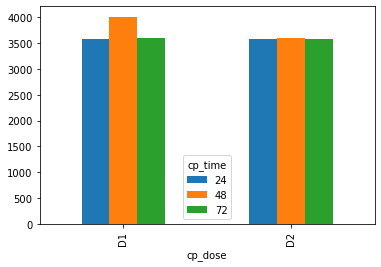

In [60]:
# interaction between cp variables 
pd.crosstab(train_feat["cp_dose"], train_feat["cp_time"]).plot(kind="bar")

# g variables

In [61]:
# clear colleration in g variables
g_feats = [i for i in train_feat.columns if "g-" in i]
correlations = train_feat[g_feats].corr().abs()
correlations = (correlations.where(np.triu(np.ones(correlations.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False))

In [62]:
correlations[correlations>0.7].shape

(904,)

In [63]:
correlations[correlations>0.7]

g-37   g-50     0.912383
g-50   g-672    0.851694
g-37   g-489    0.850502
g-50   g-489    0.847806
g-349  g-460    0.845178
                  ...   
g-126  g-195    0.700252
g-529  g-731    0.700249
g-468  g-629    0.700233
g-486  g-568    0.700213
g-349  g-411    0.700173
Length: 904, dtype: float64

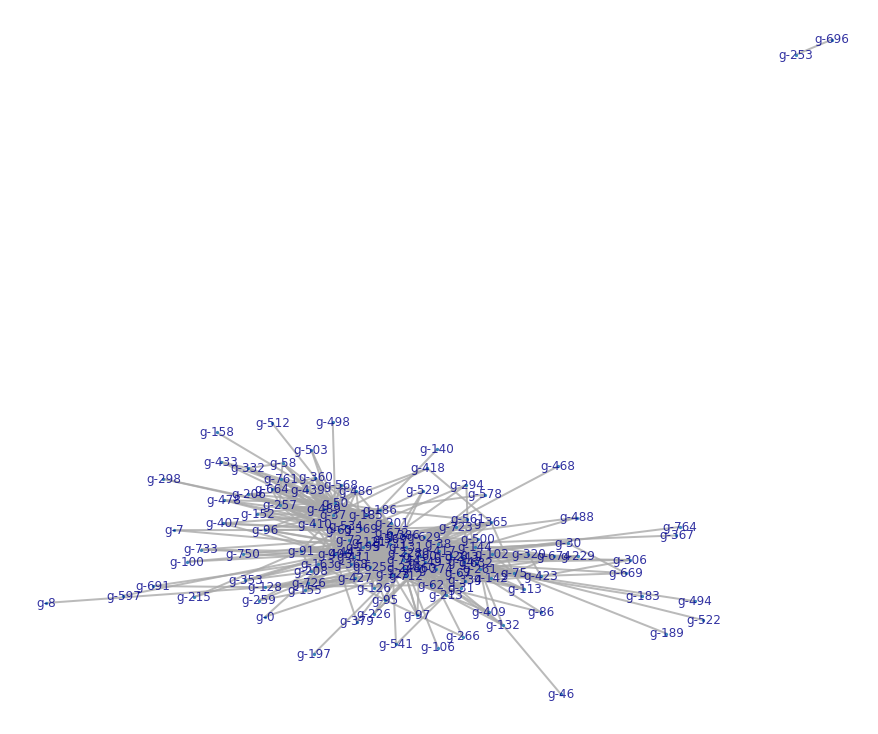

In [64]:
# https://www.kaggle.com/jpmiller/finding-patterns-in-the-scored-targets
import networkx as nx

pairs_df = (1-correlations).reset_index()
G = nx.from_pandas_edgelist(pairs_df[:904], source='level_0', target='level_1', edge_attr=0)

graph_opts = dict(arrows=False,
                  node_size=5,
                  width=2,
                  alpha=0.8,
                  font_size=12,
                  font_color='darkblue',
                  edge_color='darkgray'
                 )

fig= plt.figure(figsize=(12,10))
nx.draw_spring(G, with_labels=True, **graph_opts)

In [65]:
nx.algorithms.community.modularity_max.greedy_modularity_communities(G)

[frozenset({'g-102',
            'g-106',
            'g-113',
            'g-123',
            'g-126',
            'g-131',
            'g-132',
            'g-142',
            'g-144',
            'g-147',
            'g-155',
            'g-163',
            'g-183',
            'g-189',
            'g-195',
            'g-197',
            'g-201',
            'g-208',
            'g-213',
            'g-226',
            'g-228',
            'g-229',
            'g-243',
            'g-248',
            'g-259',
            'g-261',
            'g-266',
            'g-30',
            'g-306',
            'g-31',
            'g-320',
            'g-328',
            'g-334',
            'g-349',
            'g-365',
            'g-367',
            'g-368',
            'g-374',
            'g-38',
            'g-409',
            'g-417',
            'g-423',
            'g-443',
            'g-46',
            'g-460',
            'g-468',
            'g-488',
            'g-49

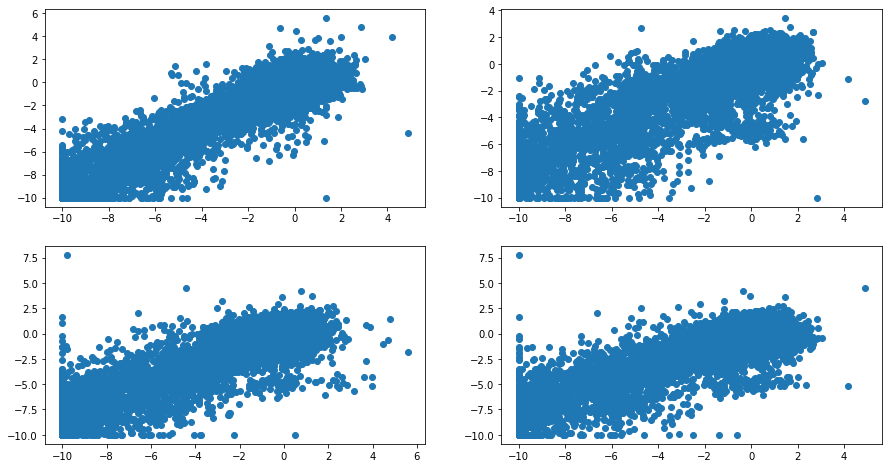

In [66]:
# some correlated examples
plt.figure(figsize=(15,8))
plt.subplot(2,2,1)
plt.scatter(train_feat["g-50"], train_feat["g-37"])
plt.subplot(2,2,2)
plt.scatter(train_feat["g-50"], train_feat["g-672"])
plt.subplot(2,2,3)
plt.scatter(train_feat["g-37"], train_feat["g-489"])
plt.subplot(2,2,4)
plt.scatter(train_feat["g-50"], train_feat["g-489"])

772
0.906670424719348


<BarContainer object of 370 artists>

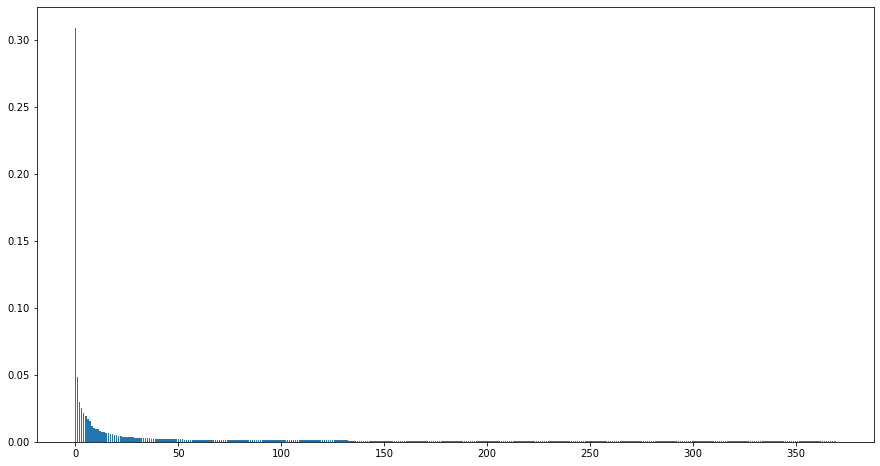

In [67]:
num = 370
print(len(g_feats))
pca = PCA(n_components=num)
pca.fit(train_feat[g_feats])
print(np.sum(np.array(pca.explained_variance_ratio_)))
plt.figure(figsize=(15,8))
plt.bar(range(num), np.array(pca.explained_variance_ratio_))

#mod_g_feats = pca.fit_transform(train_feat[g_feats])

#tsne = TSNE(random_state=0, metric="cosine")
#embs = tsne.fit_transform(mod_g_feats)
#plt.plot(embs[:,0], embs[:,1])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp

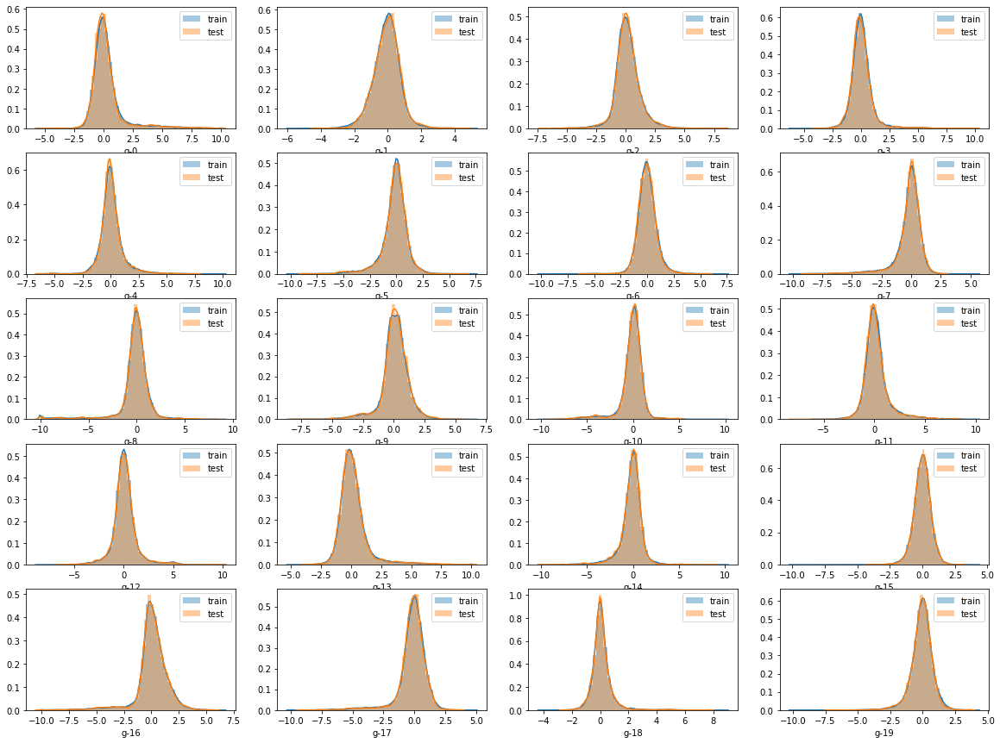

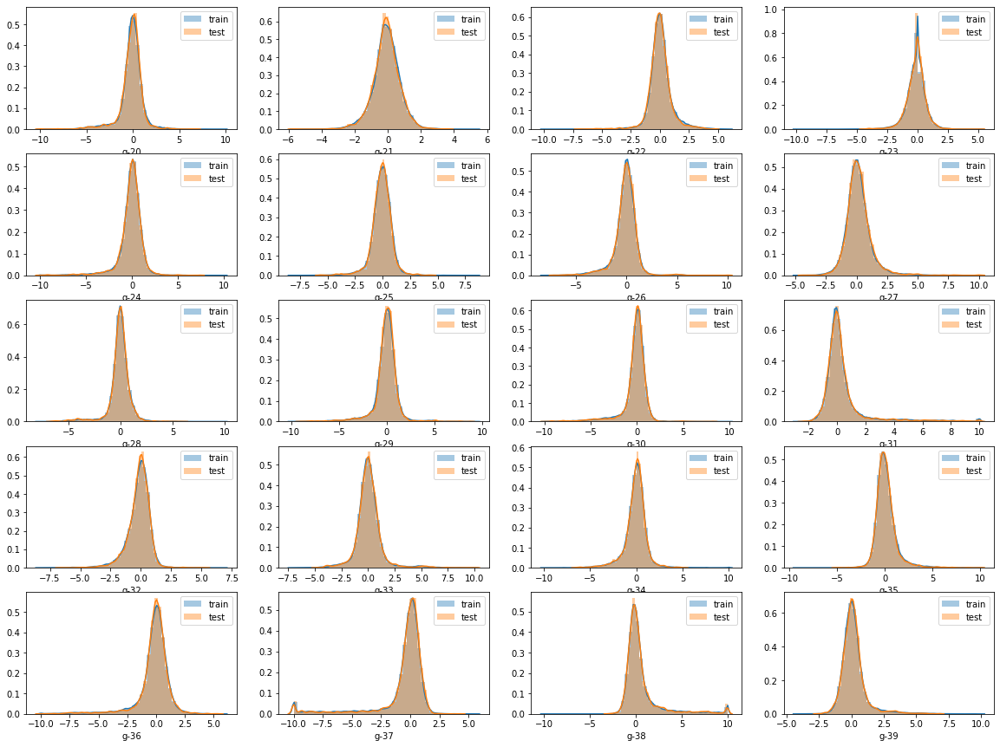

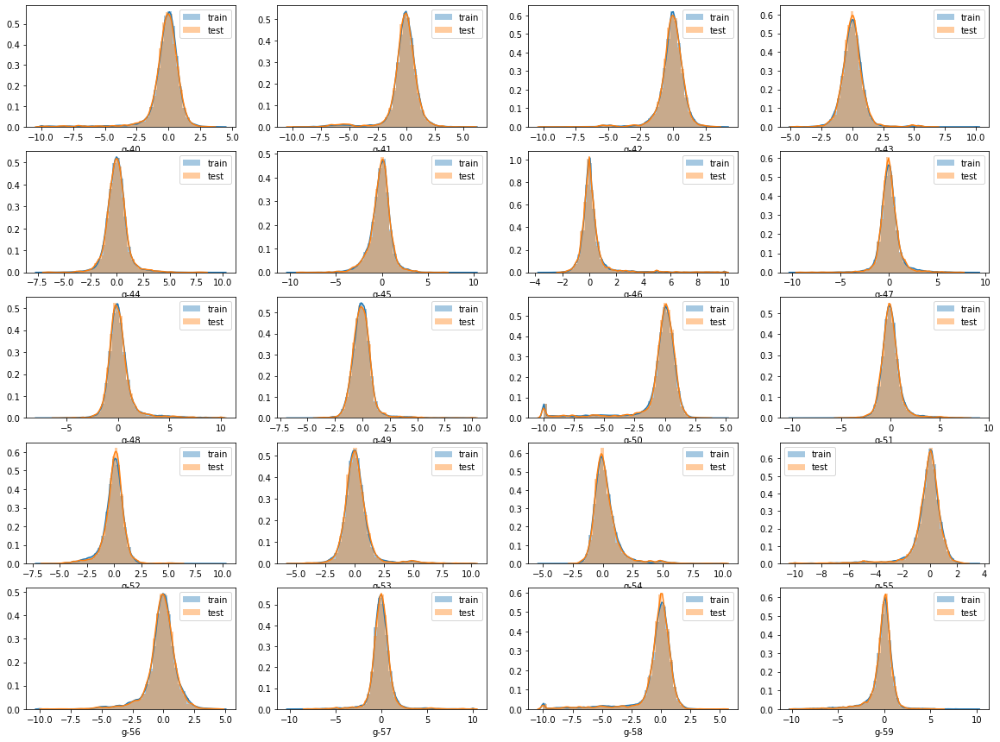

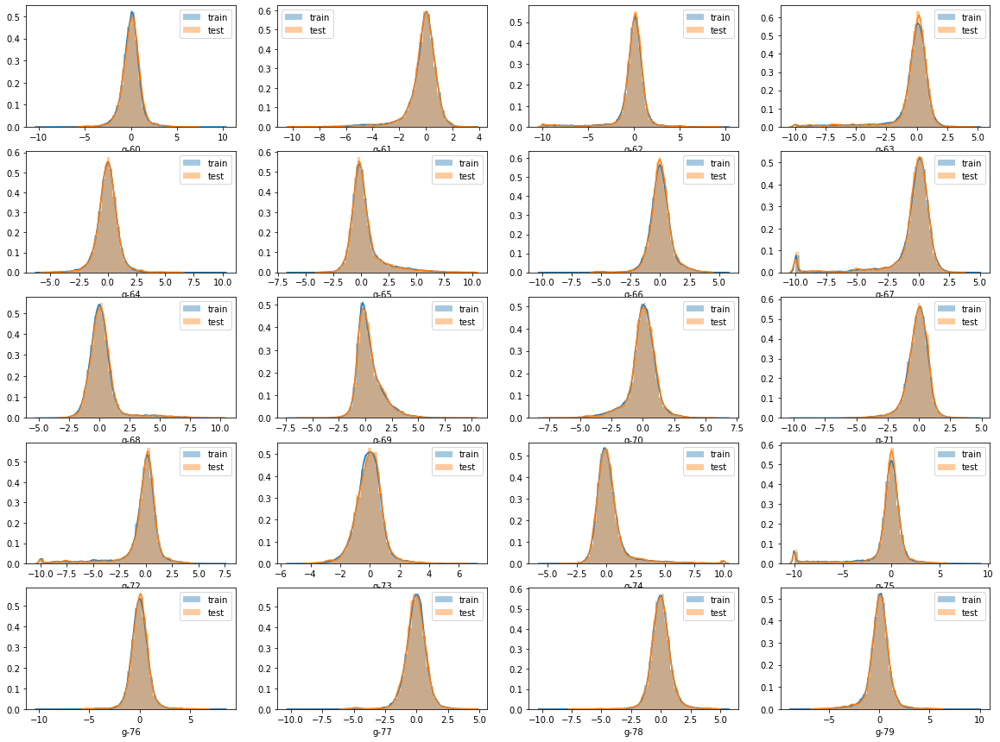

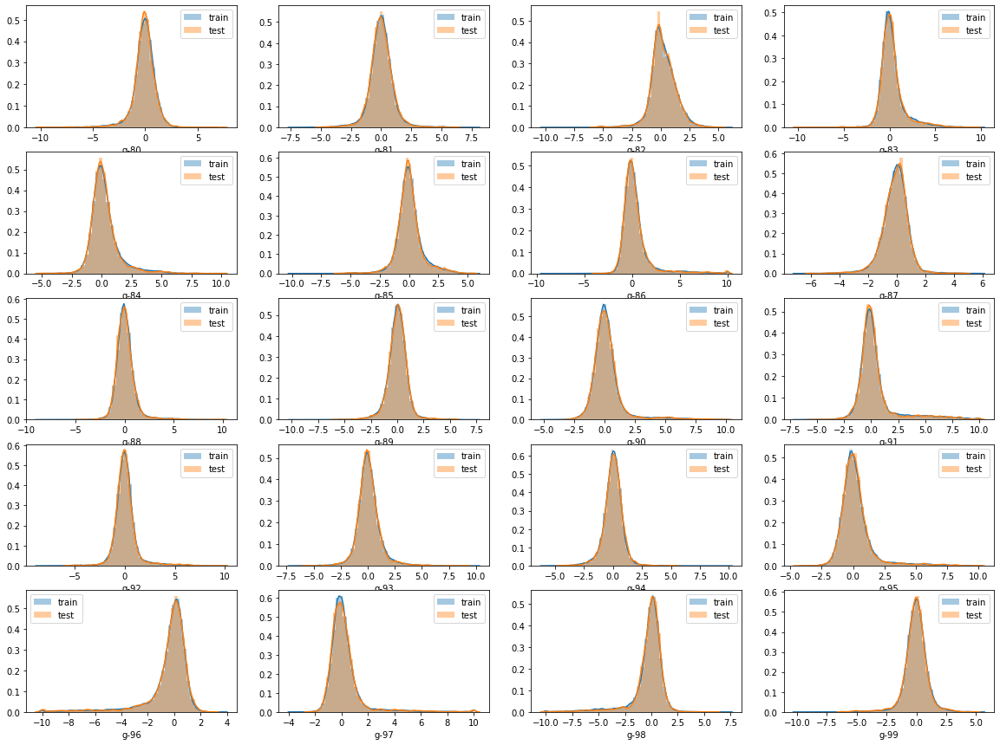

...

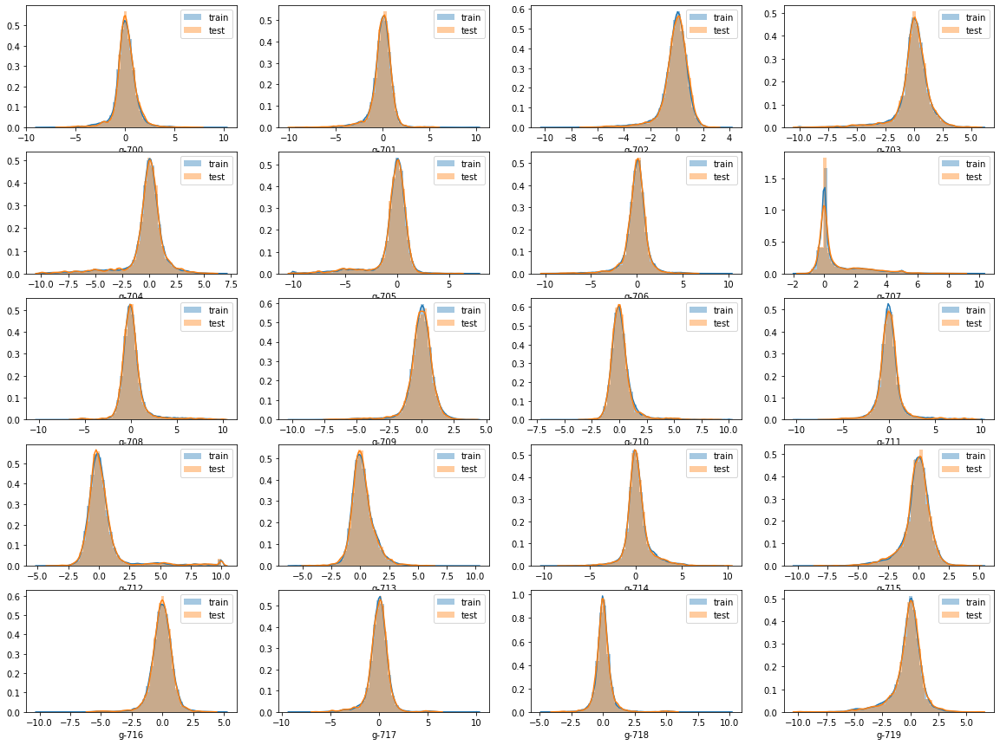

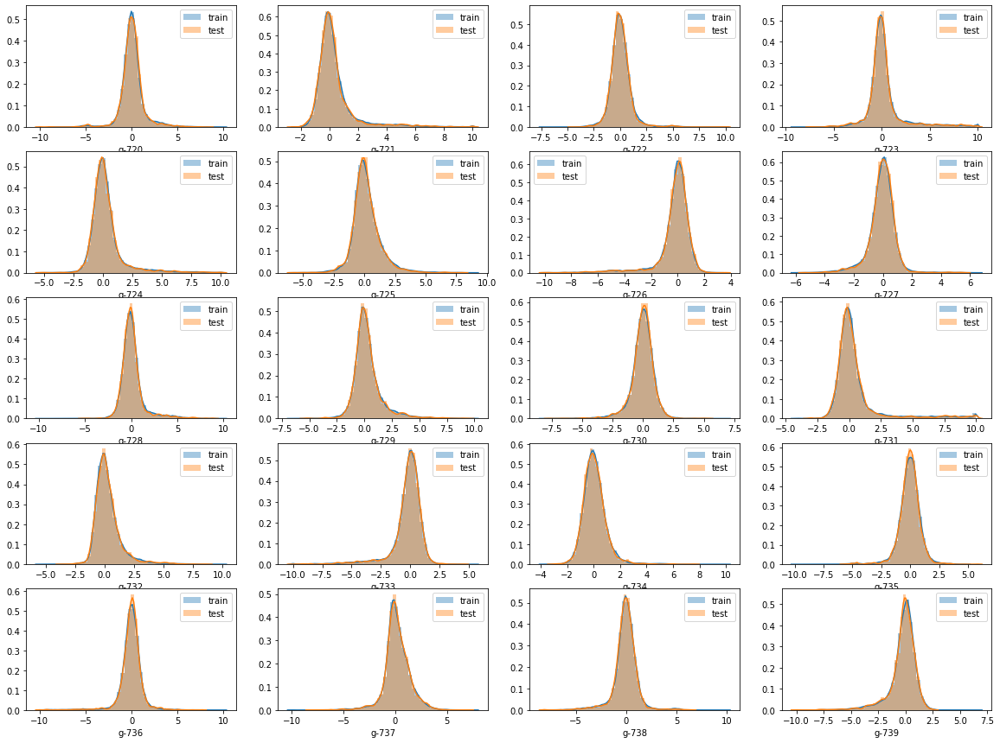

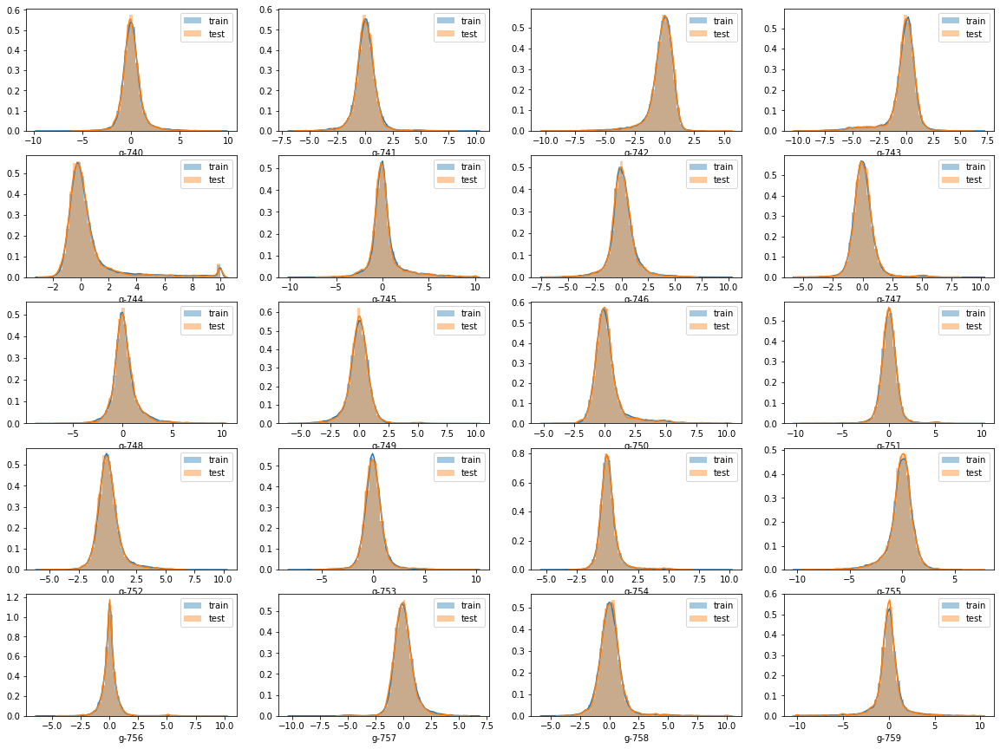

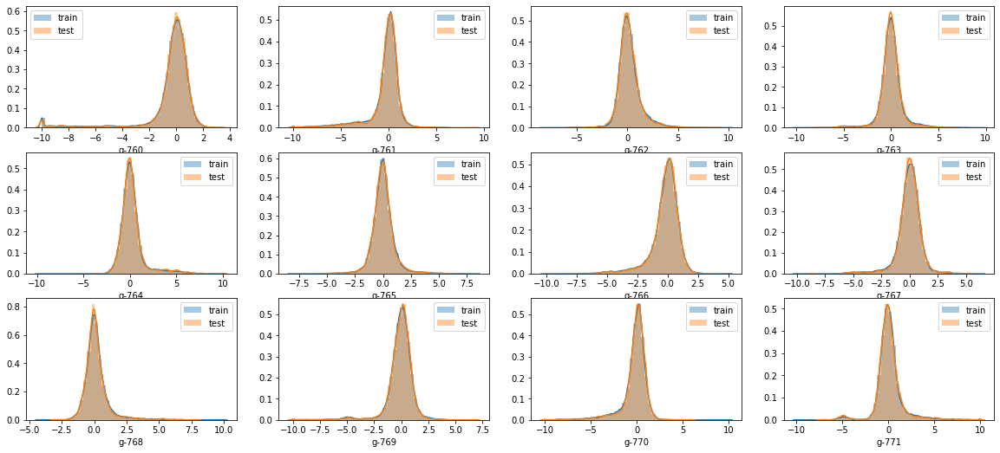

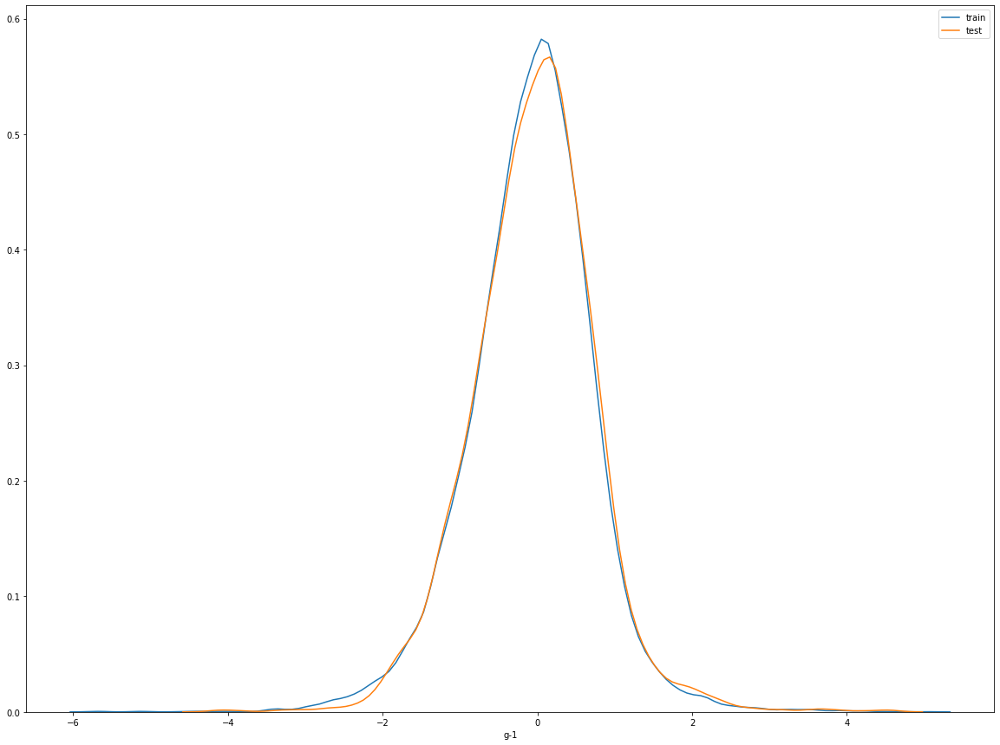

In [68]:
num = 20
for k in range(len(g_feats)//num + 1):
    plt.figure(figsize=(20,15))
    for i in range(num*k, num*(k+1)):
        if i <= len(g_feats)-1:
            plt.subplot(5,num//5,i+1-num*k)
            sns.distplot(train_feat["g-"+str(i)], label = "train")
            sns.distplot(test_feat["g-"+str(i)], label = "test")
            plt.legend(loc="best")
plt.figure(figsize=(20,15))
sns.distplot(train_feat["g-"+str(1)], label = "train", hist=False)
sns.distplot(test_feat["g-"+str(1)], label = "test", hist=False)

## per row

Text(0.5, 1.0, 'test range distribution')

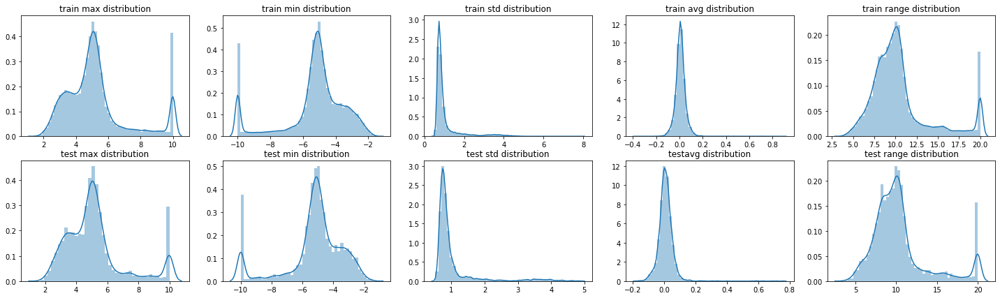

In [69]:
# there are many row with minimum value of -10 or maximum value of 10
plt.figure(figsize=(25,7))
plt.subplot(2,5,1)
sns.distplot(np.max(train_feat[g_feats], axis=1))
plt.title("train max distribution")
plt.subplot(2,5,2)
sns.distplot(np.min(train_feat[g_feats], axis=1))
plt.title("train min distribution")
plt.subplot(2,5,3)
sns.distplot(np.std(train_feat[g_feats], axis=1))
plt.title("train std distribution")
plt.subplot(2,5,4)
sns.distplot(np.mean(train_feat[g_feats], axis=1))
plt.title("train avg distribution")
plt.subplot(2,5,5)
sns.distplot(np.max(train_feat[g_feats], axis=1)-np.min(train_feat[g_feats], axis=1))
plt.title("train range distribution")

plt.subplot(2,5,6)
sns.distplot(np.max(test_feat[g_feats], axis=1))
plt.title("test max distribution")
plt.subplot(2,5,7)
sns.distplot(np.min(test_feat[g_feats], axis=1))
plt.title("test min distribution")
plt.subplot(2,5,8)
sns.distplot(np.std(test_feat[g_feats], axis=1))
plt.title("test std distribution")
plt.subplot(2,5,9)
sns.distplot(np.mean(test_feat[g_feats], axis=1))
plt.title("testavg distribution")
plt.subplot(2,5,10)
sns.distplot(np.max(test_feat[g_feats], axis=1)-np.min(test_feat[g_feats], axis=1))
plt.title("test range distribution")

In [70]:
# unique value one outlier in training data
#def calc(row):
#    return len(np.unique(row[g_feats].values))

#tqdm_notebook.pandas(desc="progress")
#train_feat["g_unique_num"] = train_feat.progress_apply(calc, axis=1)
#test_feat["g_unique_num"] = test_feat.progress_apply(calc, axis=1)
#print("train", np.max(train_feat["g_unique_num"]), np.min(train_feat["g_unique_num"]))
#print("test ", np.max(test_feat["g_unique_num"]), np.min(test_feat["g_unique_num"]))

In [71]:
#plt.figure(figsize=(25,5))
#sns.distplot(train_feat["g_unique_num"], hist=False)
#sns.distplot(test_feat["g_unique_num"], hist=False)

In [72]:
# unique value
#def calc10(row):
#    return sum(np.array(row[g_feats].values)==10)

#def calc_10(row):
#    return sum(np.array(row[g_feats].values)==-10)

#tqdm_notebook.pandas(desc="progress")
#train_feat["g10_num"] = train_feat.progress_apply(calc10, axis=1)
#test_feat["g10_num"] = test_feat.progress_apply(calc10, 

#print("train", np.max(train_feat["g10_num"]), np.min(train_feat["g10_num"]))
#print("test ", np.max(test_feat["g10_num"]), np.min(test_feat["g10_num"]))

In [73]:
#tqdm_notebook.pandas(desc="progress")
#train_feat["g_10_num"] = train_feat.progress_apply(calc_10, axis=1)
#test_feat["g_10_num"] = test_feat.progress_apply(calc_10, axis=1)
#print("train", np.max(train_feat["g_10_num"]), np.min(train_feat["g_10_num"]))
#print("test ", np.max(test_feat["g_10_num"]), np.min(test_feat["g_10_num"]))

In [74]:
# except an example with 392 unique values, others have at least 681
#tmp = pd.DataFrame(train_feat["g_unique_num"].value_counts().reset_index(drop=False))
#tmp.columns = ["g_unique_num", "no"]
#np.transpose(tmp)

In [75]:
# this example has 2 positive labels
#tmp = train_feat[train_feat["g_unique_num"]==392][g_feats].copy()
#print(tmp.index)
#tmp

In [76]:
#tmp1 = np.array(tmp)
#np.sum(tmp1 == 10), np.sum(tmp1==-10)

In [77]:
#train_mod_feat = train_feat[~train_feat.index.isin([16674])].copy()
#plt.figure(figsize=(25,5))
#sns.distplot(train_mod_feat["g_unique_num"], hist=False)
#sns.distplot(test_feat["g_unique_num"], hist=False)

# cp-variables vs g-variables

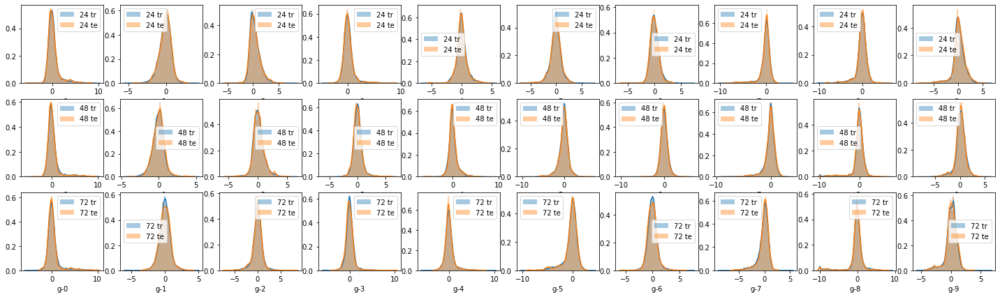

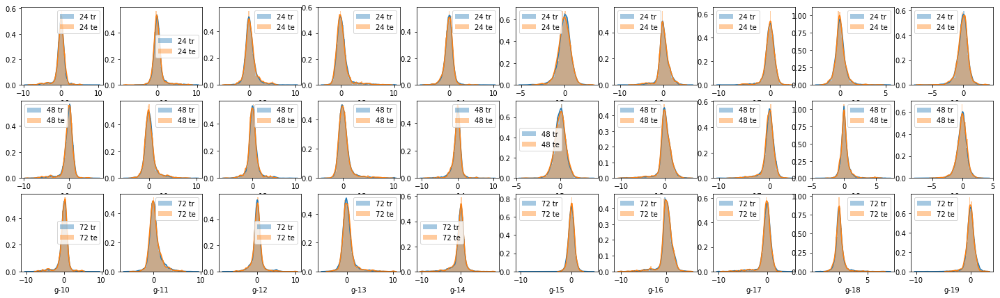

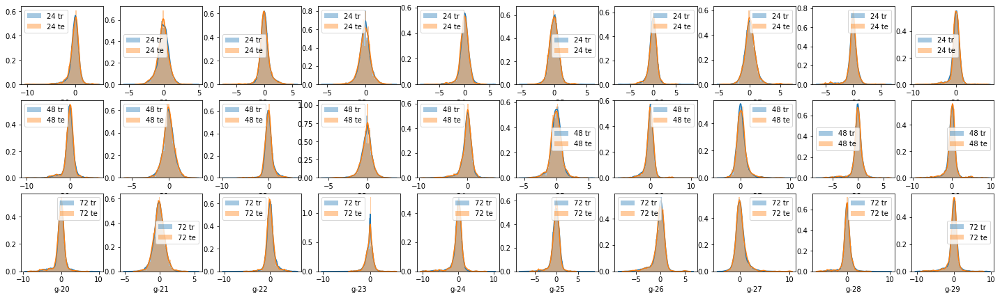

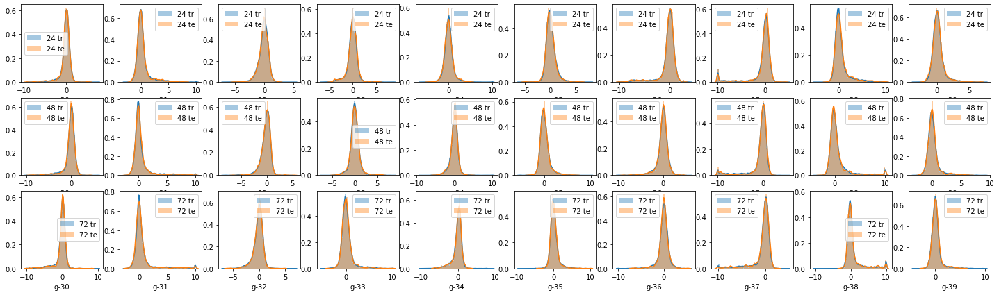

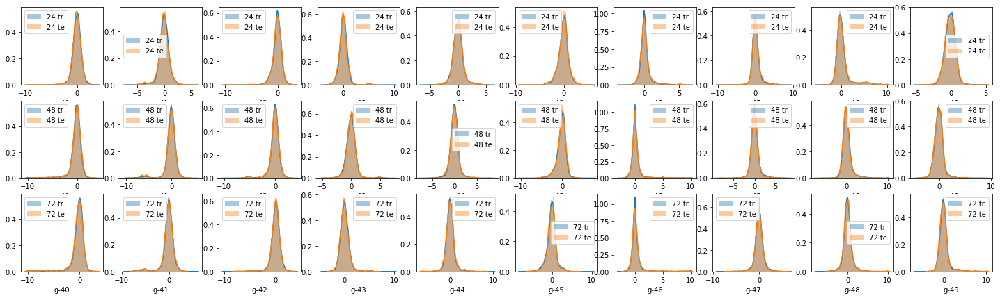

...

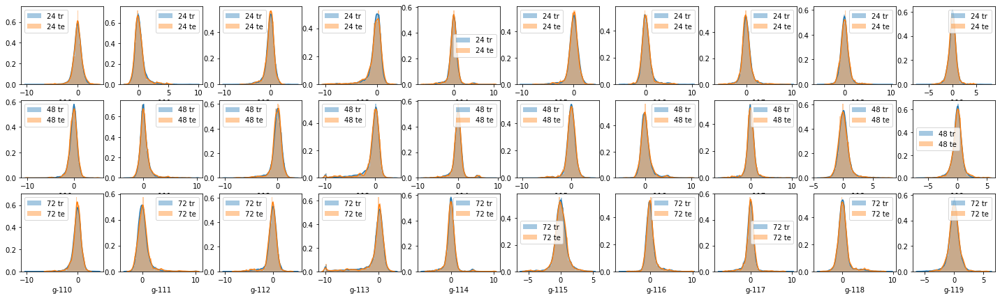

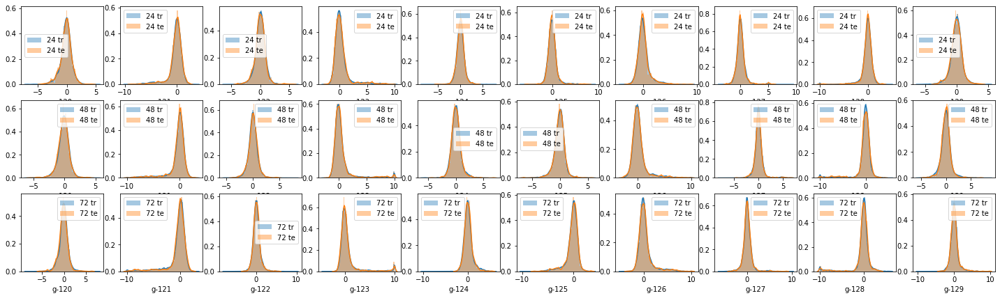

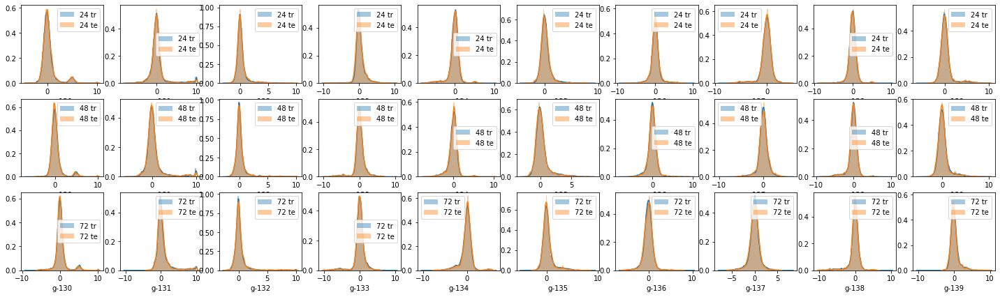

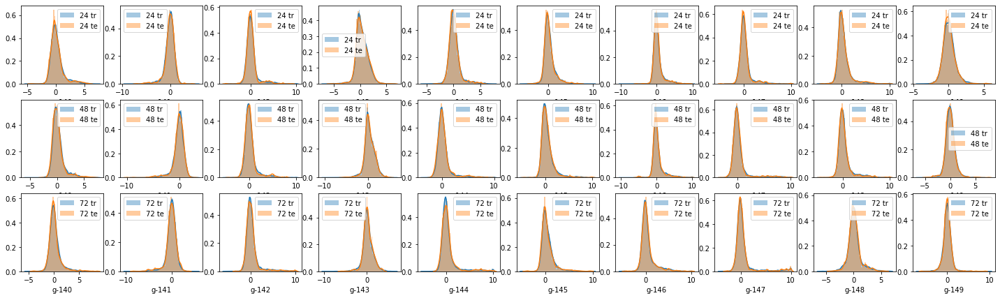

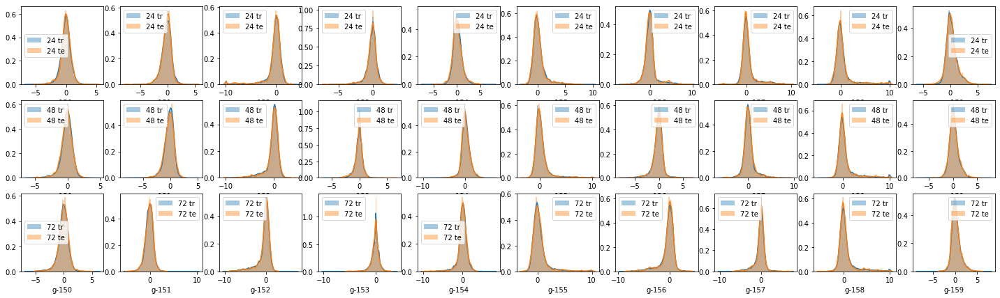

In [78]:
# "cp_time"
size = 10
for k in range(len(g_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(g_feats)-1:
            plt.subplot(3,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_time==24]["g-"+str(i)], label = "24 tr")
            sns.distplot(test_feat[test_feat.cp_time==24]["g-"+str(i)], label = "24 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+size)
            sns.distplot(train_feat[train_feat.cp_time==48]["g-"+str(i)], label = "48 tr")
            sns.distplot(test_feat[test_feat.cp_time==48]["g-"+str(i)], label = "48 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+2*size)
            sns.distplot(train_feat[train_feat.cp_time==72]["g-"+str(i)], label = "72 tr")
            sns.distplot(test_feat[test_feat.cp_time==72]["g-"+str(i)], label = "72 te")
            plt.legend(loc="best")

In [79]:
# "cp_dose"
size = 10
for k in range(len(c_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(c_feats)-1:
            plt.subplot(2,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 te")
            plt.legend(loc="best")
            plt.subplot(2,size,ind+11)
            sns.distplot(train_feat[train_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 te")
            plt.legend(loc="best")

NameError: name 'c_feats' is not defined

# c variables

In [80]:
c_feats = [i for i in train_feat.columns if "c-" in i]
correlations = train_feat[c_feats].corr().abs()
correlations = (correlations.where(np.triu(np.ones(correlations.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False))
correlations.tail(10)
correlations.head(10)
correlations[correlations>0.9].shape

(173,)

In [81]:
correlations.head(10)

c-42  c-52    0.927873
c-13  c-73    0.924338
      c-26    0.924001
c-11  c-55    0.917963
c-6   c-33    0.917805
c-4   c-52    0.917748
c-38  c-63    0.917566
      c-94    0.917296
c-4   c-42    0.917120
c-13  c-94    0.915666
dtype: float64

In [82]:
correlations[correlations>0.91].shape

(39,)

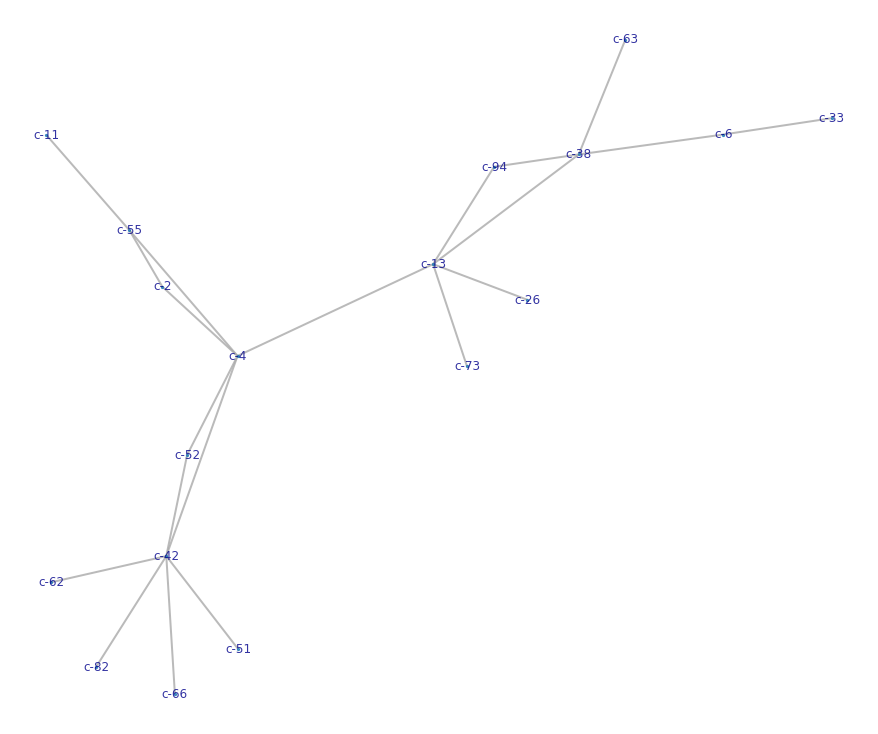

In [83]:
# https://www.kaggle.com/jpmiller/finding-patterns-in-the-scored-targets
import networkx as nx

pairs_df = (1-correlations).reset_index()
G = nx.from_pandas_edgelist(pairs_df[:20], source='level_0', target='level_1', edge_attr=0)

graph_opts = dict(arrows=False,
                  node_size=5,
                  width=2,
                  alpha=0.8,
                  font_size=12,
                  font_color='darkblue',
                  edge_color='darkgray'
                 )

fig= plt.figure(figsize=(12,10))
nx.draw_spring(G, with_labels=True, **graph_opts)

In [84]:
c_group = list(nx.algorithms.community.modularity_max.greedy_modularity_communities(G))

In [85]:
c_group

[frozenset({'c-13', 'c-26', 'c-38', 'c-63', 'c-73', 'c-94'}),
 frozenset({'c-42', 'c-51', 'c-52', 'c-62', 'c-66', 'c-82'}),
 frozenset({'c-11', 'c-2', 'c-4', 'c-55'}),
 frozenset({'c-33', 'c-6'})]

In [86]:
train_feat[c_group[0]].corr()

,c-94,c-13,c-26,c-73,c-38,c-63
c-94,1.000000,0.915666,0.901588,0.910357,0.917296,0.896230
c-13,0.915666,1.000000,0.924001,0.924338,0.914997,0.895227
c-26,0.901588,0.924001,1.000000,0.892462,0.909451,0.899707
c-73,0.910357,0.924338,0.892462,1.000000,0.881120,0.875462
c-38,0.917296,0.914997,0.909451,0.881120,1.000000,0.917566
c-63,0.896230,0.895227,0.899707,0.875462,0.917566,1.000000


In [87]:
nx.algorithms.community.modularity_max.greedy_modularity_communities(G)

[frozenset({'c-13', 'c-26', 'c-38', 'c-63', 'c-73', 'c-94'}),
 frozenset({'c-42', 'c-51', 'c-52', 'c-62', 'c-66', 'c-82'}),
 frozenset({'c-11', 'c-2', 'c-4', 'c-55'}),
 frozenset({'c-33', 'c-6'})]

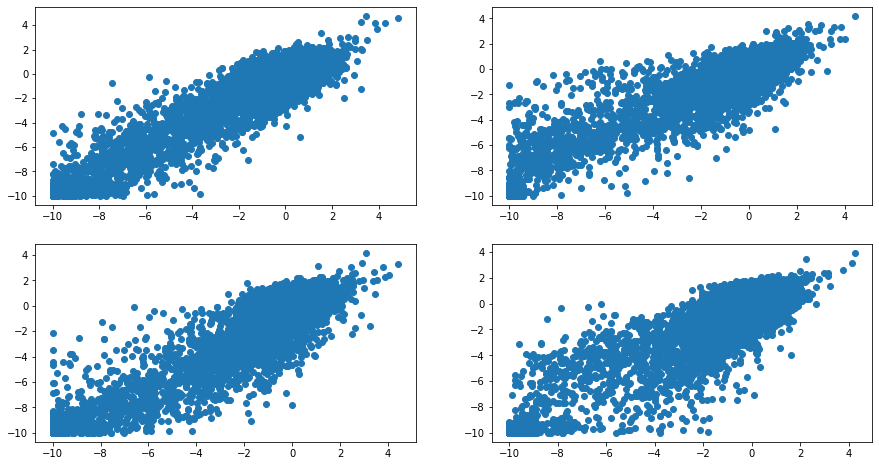

In [88]:
# some correlated examples
plt.figure(figsize=(15,8))
plt.subplot(2,2,1)
plt.scatter(train_feat["c-52"], train_feat["c-42"])
plt.subplot(2,2,2)
plt.scatter(train_feat["c-13"], train_feat["c-73"])
plt.subplot(2,2,3)
plt.scatter(train_feat["c-13"], train_feat["c-26"])
plt.subplot(2,2,4)
plt.scatter(train_feat["c-33"], train_feat["c-6"])

In [89]:
from scipy.stats import norm, entropy
for k in range(len(c_feats)):
    print(k, train_feat["c-"+str(k)].mean() - test_feat["c-"+str(k)].mean())

0 0.005484599103602661
1 -0.015199976238237711
2 -0.02758869386641527
3 -0.01837465258039228
4 -0.040876557112116685
5 -0.04743218754865636
6 -0.06732999190138822
7 -0.009146780379147734
8 -0.02097792526163228
9 -0.07128510413535893
10 -0.07449599459650091
11 -0.042128122552162084
12 -0.022417876540218318
13 -0.04433413949829734
14 -0.010306771725345443
15 -0.04693379681595283
16 0.004416735221237644
17 -0.013190431190761798
18 -0.08157825794140772
19 -0.0022714827008329386
20 -0.03385761732728615
21 -0.051975367213535906
22 -0.07215560115299591
23 -0.009760046669611722
24 -0.039949228142497184
25 -0.064957388158282
26 -0.06855514151751929
27 -0.029879567931186624
28 -0.03198268023938777
29 -0.009947894903908572
30 -0.024193876058038133
31 -0.02611605124454386
32 0.012260398147578733
33 -0.04435510986534508
34 -0.05126966541626904
35 -0.014594250694293875
36 -0.04655745034621095
37 0.017747654510298472
38 -0.06341761141928282
39 -0.017731472070649734
40 -0.014799162288466117
41 -0.0605

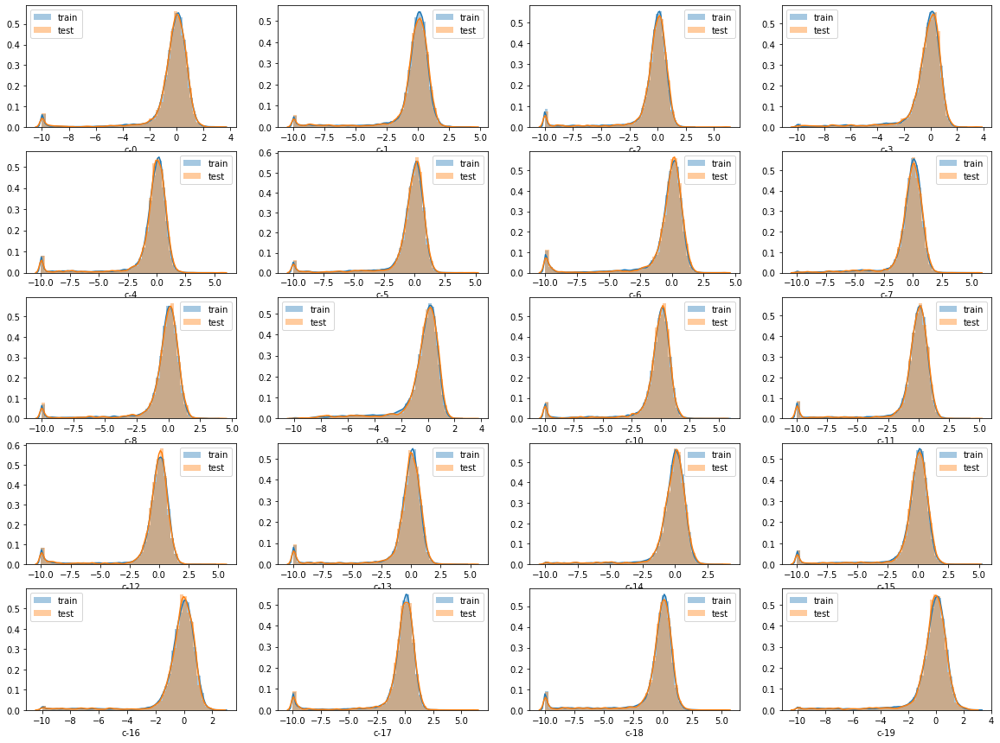

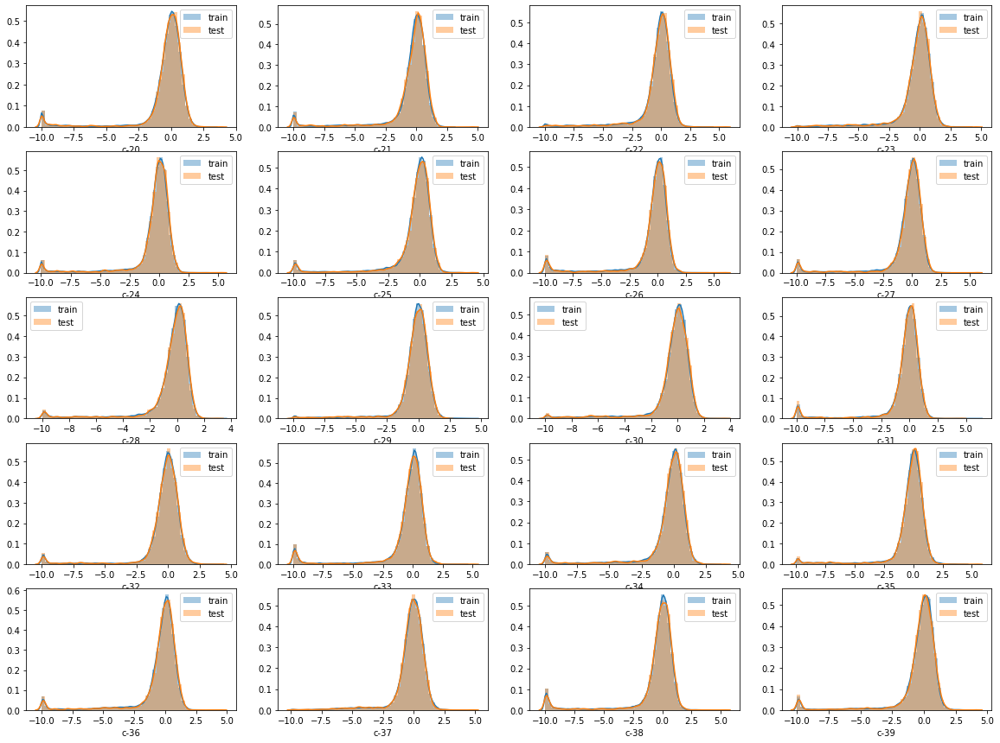

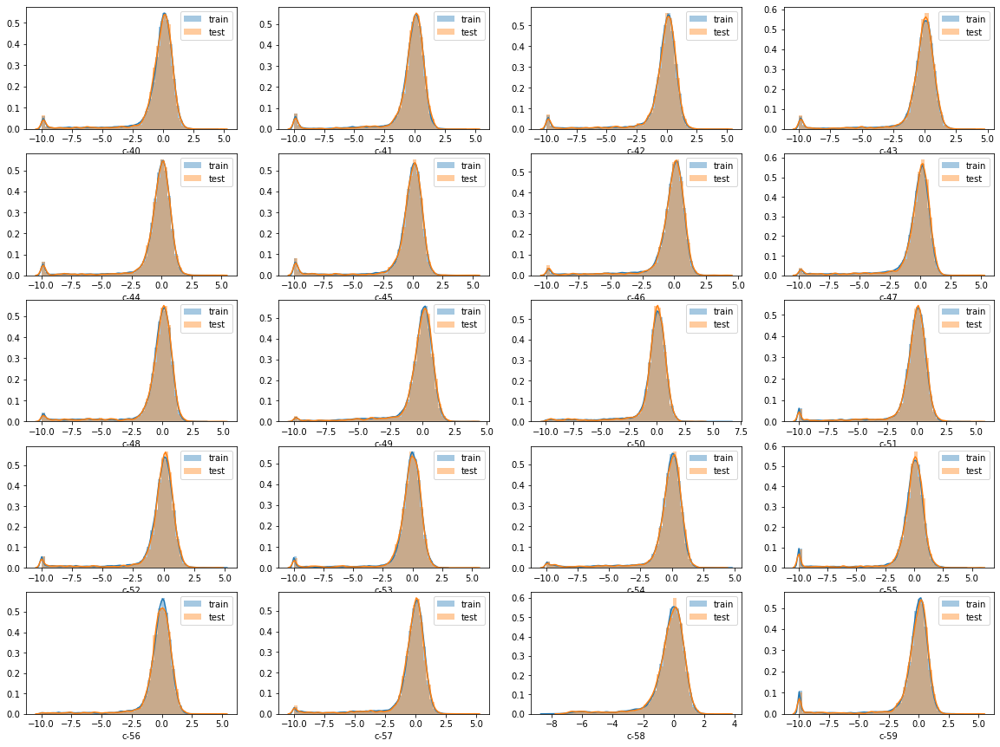

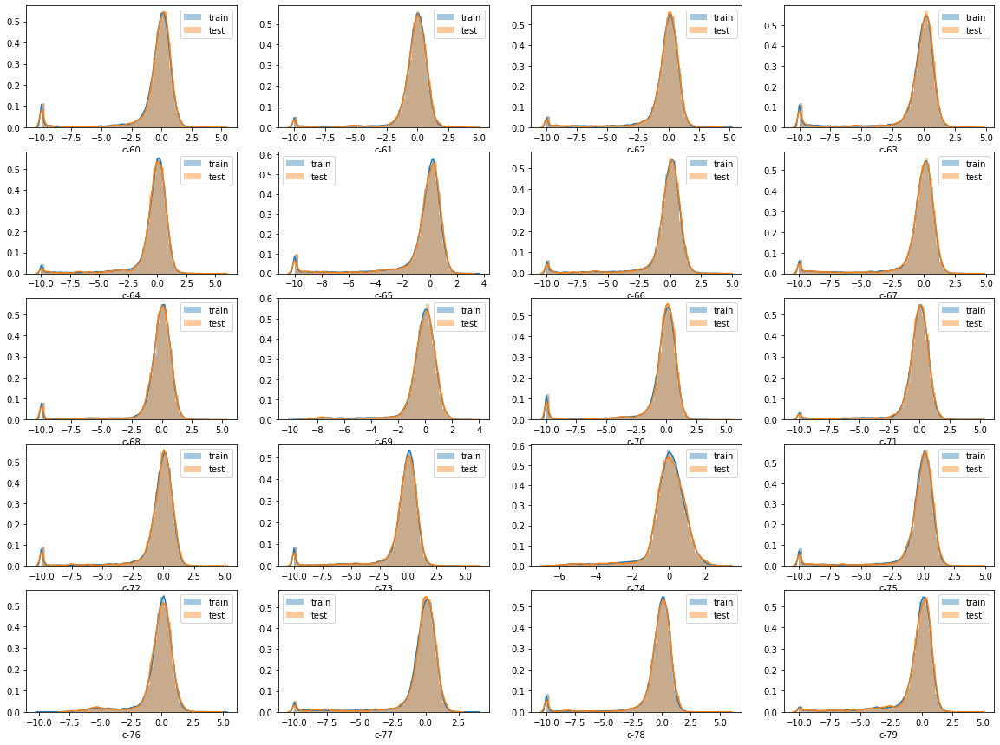

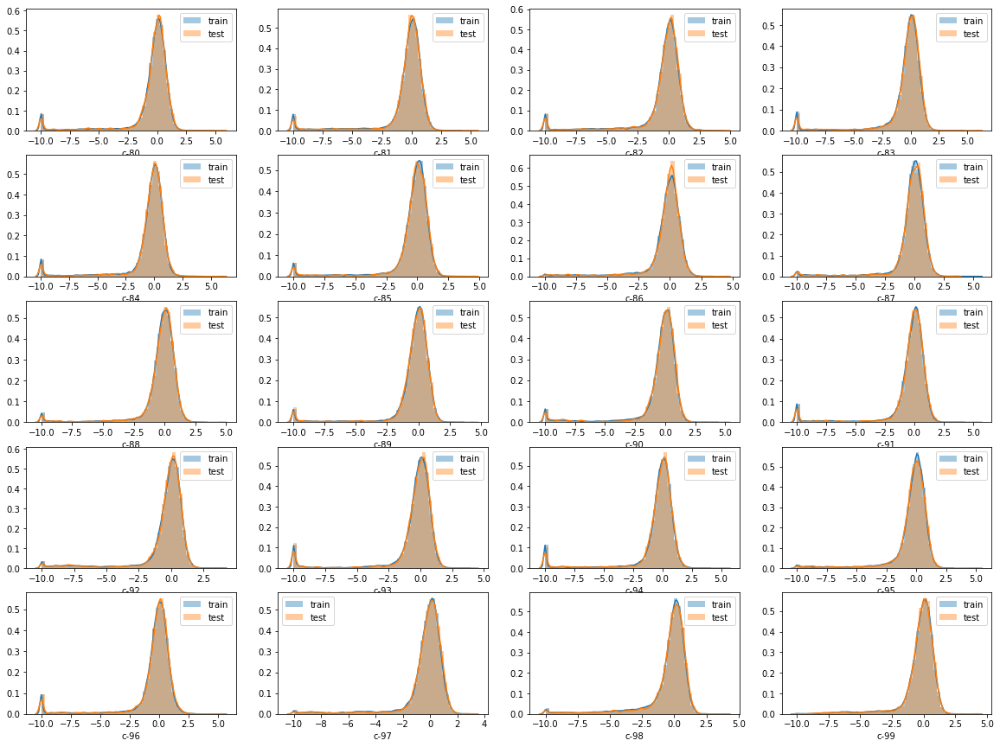

<Figure size 1440x1080 with 0 Axes>

In [90]:
for k in range(len(c_feats)//20 + 1):
    plt.figure(figsize=(20,15))
    for i in range(20*k, 20*(k+1)):
        if i <= len(c_feats)-1:
            plt.subplot(5,4,i+1-20*k)
            sns.distplot(train_feat["c-"+str(i)], label = "train")
            sns.distplot(test_feat["c-"+str(i)], label = "test")
            plt.legend(loc="best")

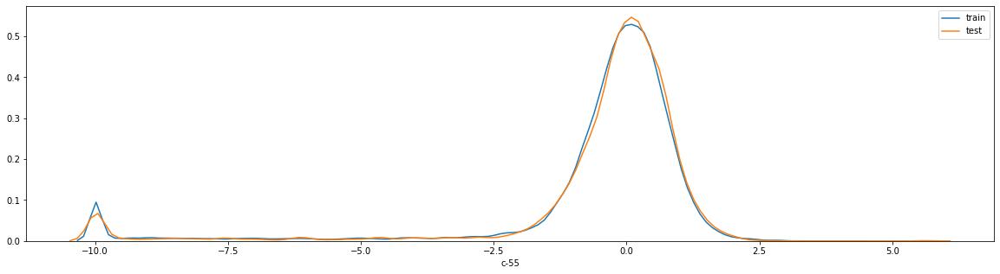

In [91]:
plt.figure(figsize=(20,5))
sns.distplot(train_feat["c-55"], label = "train", hist=False)
sns.distplot(test_feat["c-55"], label = "test", hist=False)

100
[0.85304354 0.01120614 0.00802776 0.00564019 0.00446351 0.00368992
 0.00361559 0.00322057 0.0030473  0.00288796]
0.8988424796128867


<BarContainer object of 10 artists>

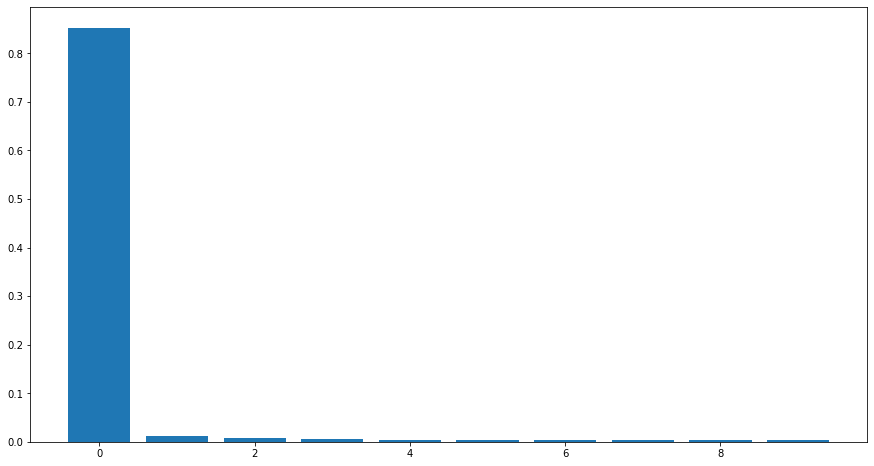

In [92]:
# TSNE
num = 10
print(len(c_feats))
pca = PCA(n_components=num)
pca.fit(train_feat[c_feats])
print(np.array(pca.explained_variance_ratio_))
print(np.sum(np.array(pca.explained_variance_ratio_)))
plt.figure(figsize=(15,8))
plt.bar(range(num), np.array(pca.explained_variance_ratio_))

#mod_c_feats = pca.fit_transform(train_feat[c_feats])

#tsne = TSNE(random_state=0, metric="cosine")
#embs = tsne.fit_transform(mod_c_feats)
#plt.plot(embs[:,0], embs[:,1])

## per row

Text(0.5, 1.0, 'test range distribution')

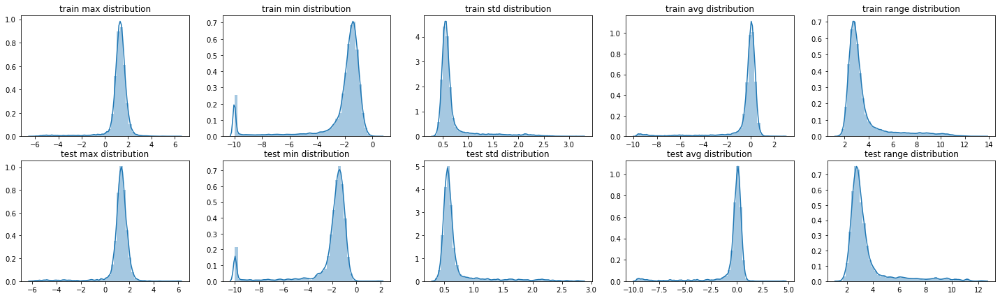

In [93]:
# there are many row with minimum value of -10 or maximum value of 10
plt.figure(figsize=(25,7))
plt.subplot(2,5,1)
sns.distplot(np.max(train_feat[c_feats], axis=1))
plt.title("train max distribution")
plt.subplot(2,5,2)
sns.distplot(np.min(train_feat[c_feats], axis=1))
plt.title("train min distribution")
plt.subplot(2,5,3)
sns.distplot(np.std(train_feat[c_feats], axis=1))
plt.title("train std distribution")
plt.subplot(2,5,4)
sns.distplot(np.mean(train_feat[c_feats], axis=1))
plt.title("train avg distribution")
plt.subplot(2,5,5)
sns.distplot(np.max(train_feat[c_feats], axis=1)-np.min(train_feat[c_feats], axis=1))
plt.title("train range distribution")

plt.subplot(2,5,6)
sns.distplot(np.max(test_feat[c_feats], axis=1))
plt.title("test max distribution")
plt.subplot(2,5,7)
sns.distplot(np.min(test_feat[c_feats], axis=1))
plt.title("test min distribution")
plt.subplot(2,5,8)
sns.distplot(np.std(test_feat[c_feats], axis=1))
plt.title("test std distribution")
plt.subplot(2,5,9)
sns.distplot(np.mean(test_feat[c_feats], axis=1))
plt.title("test avg distribution")
plt.subplot(2,5,10)
sns.distplot(np.max(test_feat[c_feats], axis=1)-np.min(test_feat[c_feats], axis=1))
plt.title("test range distribution")

In [94]:
print((mod_train_z[c_feats] == -10).sum().sum() / (mod_train_z[c_feats].shape[0] * mod_train_z[c_feats].shape[1]))
print((mod_train_nonz[c_feats] == -10).sum().sum() / (mod_train_z[c_feats].shape[0] * mod_train_z[c_feats].shape[1]))

0.0011131849086788428
0.021081189174776697


In [95]:
print((mod_train_z[g_feats] == -10).sum().sum() / (mod_train_z[g_feats].shape[0] * mod_train_z[g_feats].shape[1]))
print((mod_train_nonz[g_feats] == -10).sum().sum() / (mod_train_z[g_feats].shape[0] * mod_train_z[g_feats].shape[1]))

9.946860280460014e-05
0.0011922417252829157


In [96]:
print((mod_train_z[g_feats] == 10).sum().sum() / (mod_train_z[g_feats].shape[0] * mod_train_z[g_feats].shape[1]))
print((mod_train_nonz[g_feats] == 10).sum().sum() / (mod_train_z[g_feats].shape[0] * mod_train_z[g_feats].shape[1]))

9.670558606002792e-05
0.0010751588907316676


Text(0.5, 1.0, 'test range distribution')

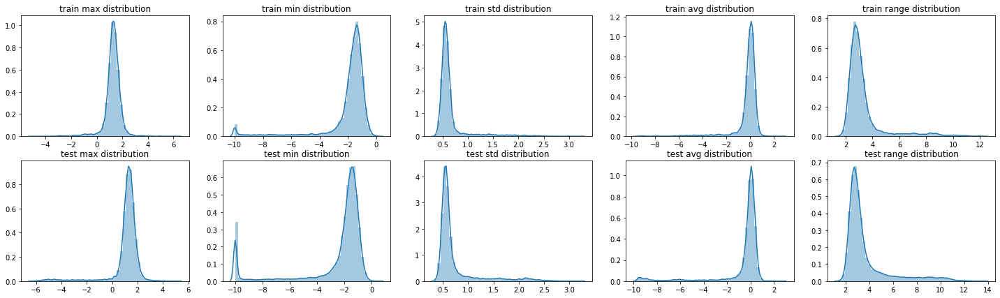

In [97]:
# there are many row with minimum value of -10 or maximum value of 10
plt.figure(figsize=(25,7))
plt.subplot(2,5,1)
sns.distplot(np.max(mod_train_z[c_feats], axis=1))
plt.title("train max distribution")
plt.subplot(2,5,2)
sns.distplot(np.min(mod_train_z[c_feats], axis=1))
plt.title("train min distribution")
plt.subplot(2,5,3)
sns.distplot(np.std(mod_train_z[c_feats], axis=1))
plt.title("train std distribution")
plt.subplot(2,5,4)
sns.distplot(np.mean(mod_train_z[c_feats], axis=1))
plt.title("train avg distribution")
plt.subplot(2,5,5)
sns.distplot(np.max(mod_train_z[c_feats], axis=1)-np.min(mod_train_z[c_feats], axis=1))
plt.title("train range distribution")

plt.subplot(2,5,6)
sns.distplot(np.max(mod_train_nonz[c_feats], axis=1))
plt.title("test max distribution")
plt.subplot(2,5,7)
sns.distplot(np.min(mod_train_nonz[c_feats], axis=1))
plt.title("test min distribution")
plt.subplot(2,5,8)
sns.distplot(np.std(mod_train_nonz[c_feats], axis=1))
plt.title("test std distribution")
plt.subplot(2,5,9)
sns.distplot(np.mean(mod_train_nonz[c_feats], axis=1))
plt.title("test avg distribution")
plt.subplot(2,5,10)
sns.distplot(np.max(mod_train_nonz[c_feats], axis=1)-np.min(mod_train_nonz[c_feats], axis=1))
plt.title("test range distribution")

Text(0.5, 1.0, 'test range distribution')

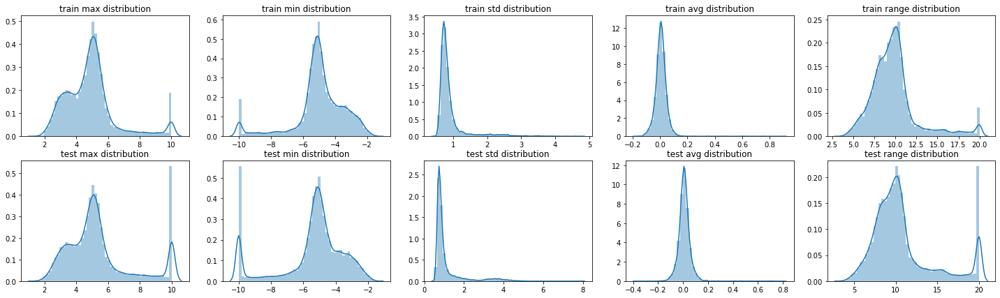

In [98]:
# there are many row with minimum value of -10 or maximum value of 10
plt.figure(figsize=(25,7))
plt.subplot(2,5,1)
sns.distplot(np.max(mod_train_z[g_feats], axis=1))
plt.title("train max distribution")
plt.subplot(2,5,2)
sns.distplot(np.min(mod_train_z[g_feats], axis=1))
plt.title("train min distribution")
plt.subplot(2,5,3)
sns.distplot(np.std(mod_train_z[g_feats], axis=1))
plt.title("train std distribution")
plt.subplot(2,5,4)
sns.distplot(np.mean(mod_train_z[g_feats], axis=1))
plt.title("train avg distribution")
plt.subplot(2,5,5)
sns.distplot(np.max(mod_train_z[g_feats], axis=1)-np.min(mod_train_z[g_feats], axis=1))
plt.title("train range distribution")

plt.subplot(2,5,6)
sns.distplot(np.max(mod_train_nonz[g_feats], axis=1))
plt.title("test max distribution")
plt.subplot(2,5,7)
sns.distplot(np.min(mod_train_nonz[g_feats], axis=1))
plt.title("test min distribution")
plt.subplot(2,5,8)
sns.distplot(np.std(mod_train_nonz[g_feats], axis=1))
plt.title("test std distribution")
plt.subplot(2,5,9)
sns.distplot(np.mean(mod_train_nonz[g_feats], axis=1))
plt.title("test avg distribution")
plt.subplot(2,5,10)
sns.distplot(np.max(mod_train_nonz[g_feats], axis=1)-np.min(mod_train_nonz[g_feats], axis=1))
plt.title("test range distribution")

In [99]:
mod_train_z["g10"] = (mod_train_z[g_feats] >= 8.).sum(axis=1) 
mod_train_nonz["g10"] = (mod_train_nonz[g_feats] >= 8.).sum(axis=1) 

mod_train_z["gm10"] = (mod_train_z[g_feats] <= -8.).sum(axis=1) 
mod_train_nonz["gm10"] = (mod_train_nonz[g_feats] <= -8.).sum(axis=1) 

mod_train_z["cm10"] = (mod_train_z[c_feats] <= -8.).sum(axis=1) 
mod_train_nonz["cm10"] = (mod_train_nonz[c_feats] <= -8).sum(axis=1) 

In [100]:
mod_train_z[["g10", "gm10", "cm10", "sum_of_moa"]]

,g10,gm10,cm10,sum_of_moa
0,0,0,0,0
1,0,0,0,0
2,1,1,0,0
3,0,0,0,0
4,1,0,11,0
...,...,...,...,...
7496,0,0,0,0
7497,0,0,0,0
7498,0,0,0,0
7499,0,0,0,0


In [101]:
mod_train_nonz[["g10", "gm10", "cm10", "sum_of_moa"]]

,g10,gm10,cm10,sum_of_moa
0,0,0,0,1
1,0,0,0,3
2,0,1,0,1
3,0,0,0,1
4,0,0,0,1
...,...,...,...,...
14442,0,0,0,1
14443,0,0,0,1
14444,0,0,0,1
14445,0,0,0,1


In [102]:
(mod_train_z["c-0"]==-10).astype(int)

0       0
1       0
2       0
3       0
4       0
       ..
7496    0
7497    0
7498    0
7499    0
7500    0
Name: c-0, Length: 7501, dtype: int64

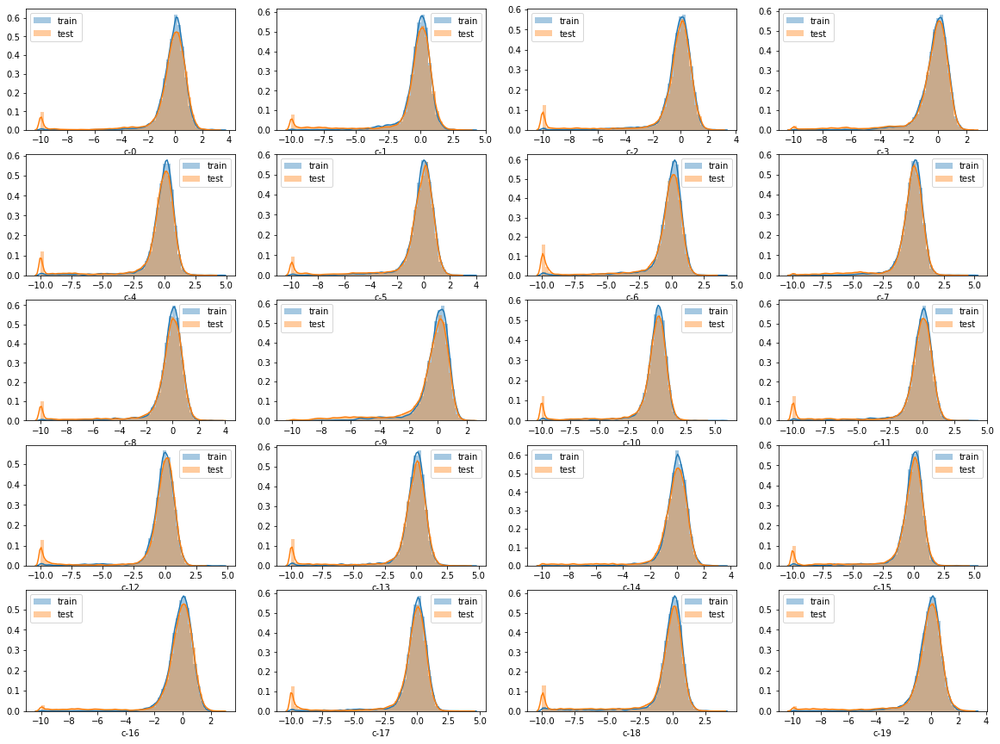

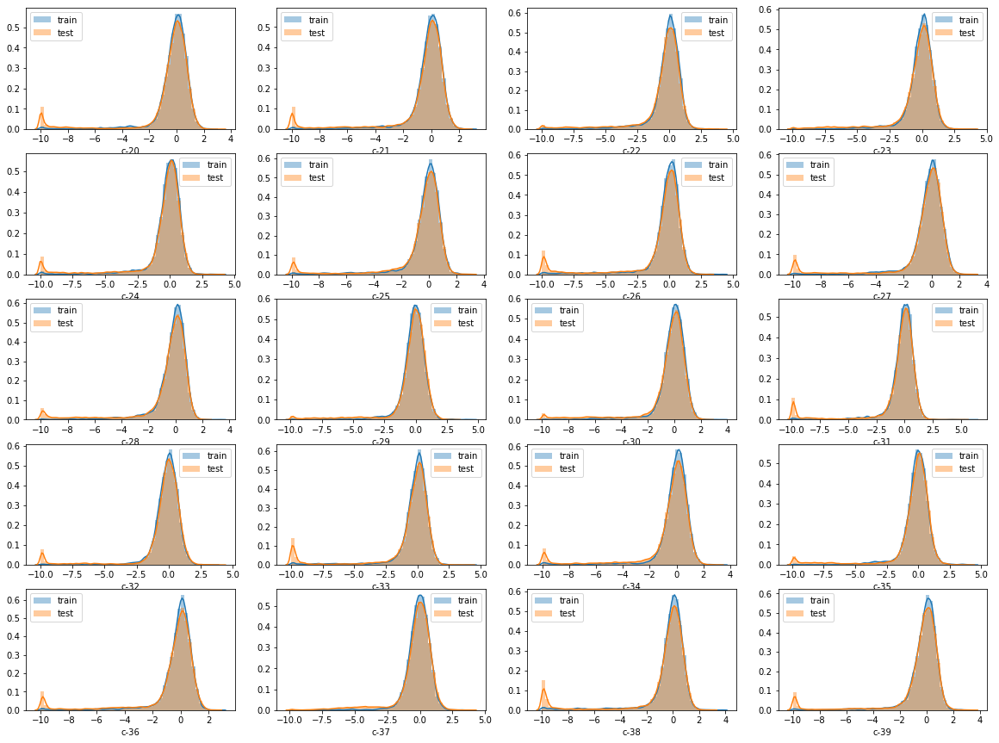

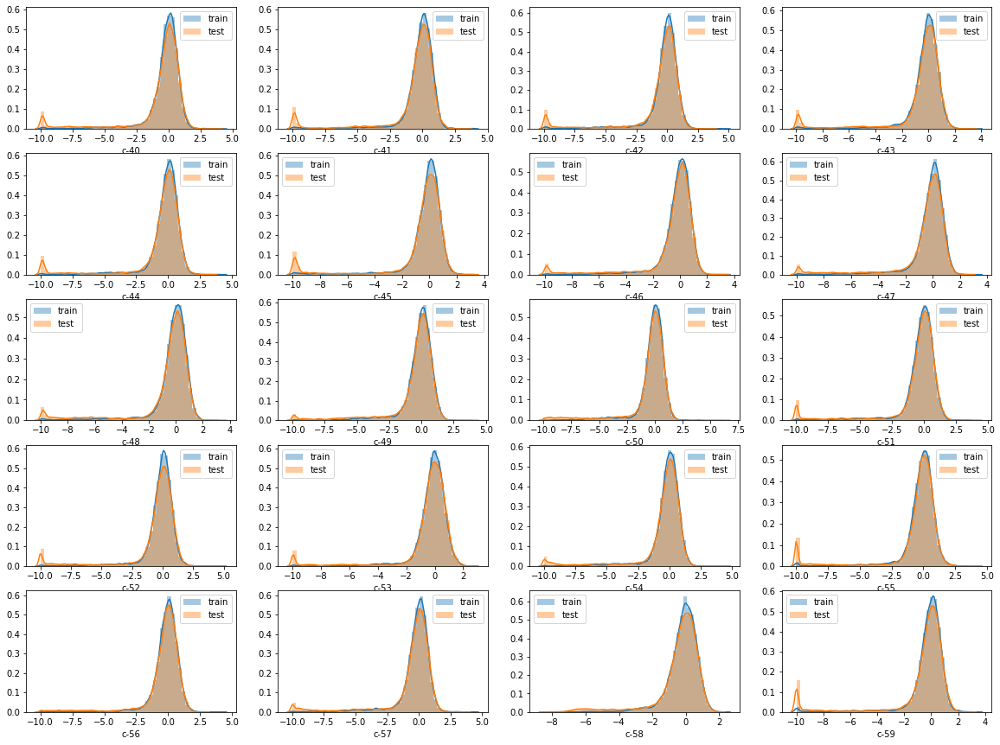

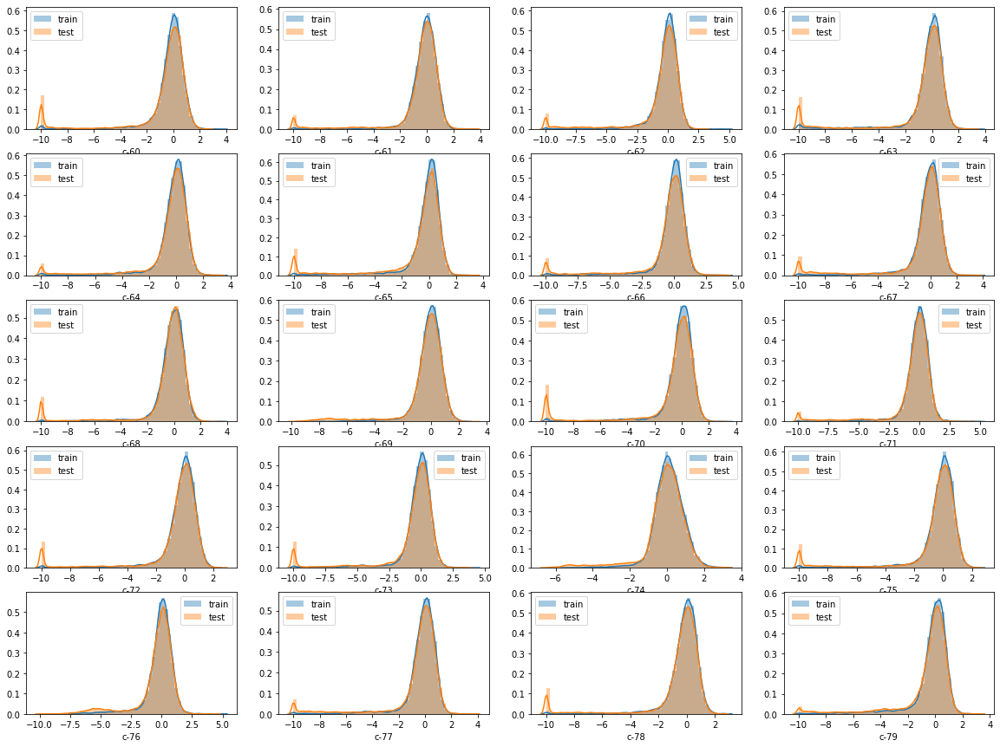

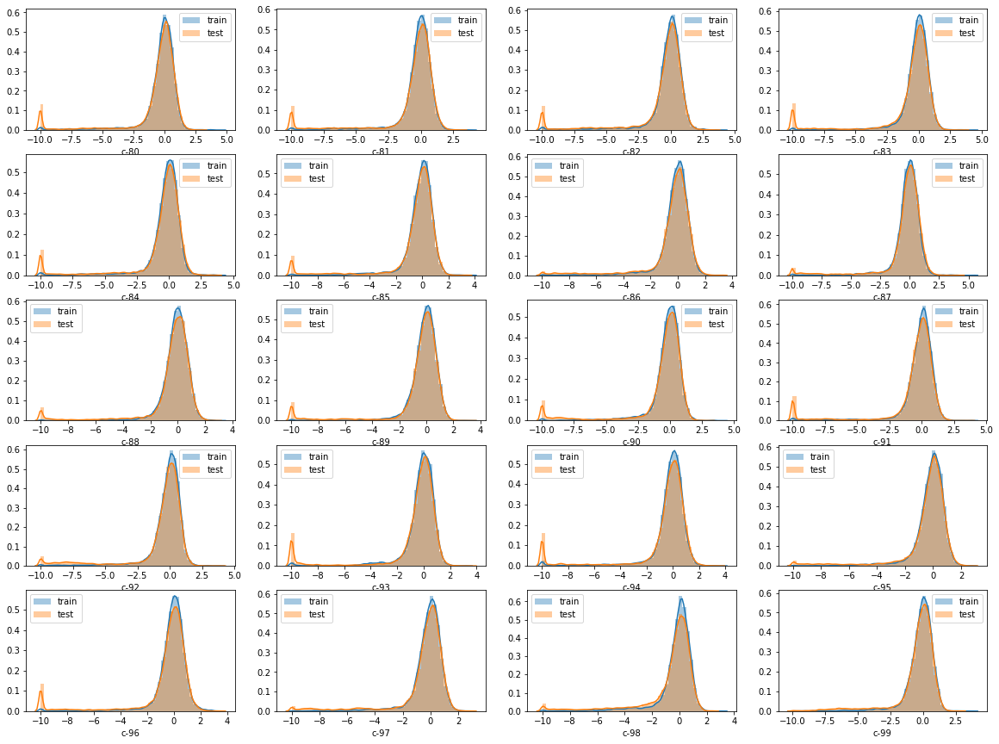

<Figure size 1440x1080 with 0 Axes>

In [103]:
for k in range(len(c_feats)//20 + 1):
    plt.figure(figsize=(20,15))
    for i in range(20*k, 20*(k+1)):
        if i <= len(c_feats)-1:
            plt.subplot(5,4,i+1-20*k)
            sns.distplot(mod_train_z["c-"+str(i)], label = "train")
            sns.distplot(mod_train_nonz["c-"+str(i)], label = "test")
            plt.legend(loc="best")

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel



train 100 8
test  100 14


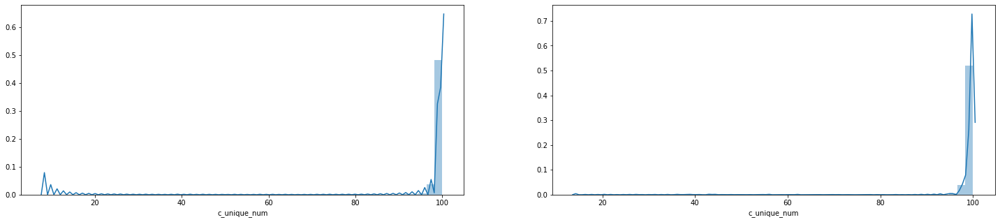

In [104]:
# unique value
def calc(row):
    return len(np.unique(row[c_feats].values))

tqdm_notebook.pandas(desc="progress")
train_feat["c_unique_num"] = train_feat.progress_apply(calc, axis=1)
test_feat["c_unique_num"] = test_feat.progress_apply(calc, axis=1)

print("train", np.max(train_feat["c_unique_num"]), np.min(train_feat["c_unique_num"]))
print("test ", np.max(test_feat["c_unique_num"]), np.min(test_feat["c_unique_num"]))

plt.figure(figsize=(25,5))
plt.subplot(1,2,1)
sns.distplot(train_feat["c_unique_num"])
plt.subplot(1,2,2)
sns.distplot(test_feat["c_unique_num"])

In [105]:
tmp = pd.DataFrame(train_feat["c_unique_num"].value_counts().reset_index(drop=False))
tmp.columns = ["c_unique_num", "no"]
np.transpose(tmp)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92
c_unique_num,100,99,98,97,96,95,94,91,92,93,87,46,32,34,45,50,39,86,38,90,54,42,37,49,52,28,44,89,88,31,25,41,35,84,48,73,27,47,26,58,85,40,33,64,51,24,30,72,21,71,61,59,57,74,78,66,43,20,19,60,53,79,83,70,29,65,82,62,36,63,69,56,81,77,55,23,68,22,76,75,13,18,80,11,15,12,67,17,14,8,10,9,16
no,14207,5317,1289,243,94,51,34,21,21,18,16,15,15,14,14,14,14,14,14,14,13,13,13,12,12,12,12,11,11,11,11,11,11,10,10,10,10,10,10,10,10,10,10,9,9,9,9,9,8,8,8,8,8,8,7,7,7,7,7,7,7,6,6,6,6,6,5,5,5,5,5,4,4,4,4,4,4,4,4,3,3,3,3,3,2,2,2,1,1,1,1,1,1


In [106]:
tmp = train_feat[train_feat["c_unique_num"]==8][c_feats].copy()
print(tmp.T[1021].value_counts())
tmp

KeyError: 1021

In [107]:
train_feat[train_feat["c_unique_num"]==11][c_feats]

,c-0,c-1,c-2,c-3,c-4,c-5,c-6,c-7,c-8,c-9,c-10,c-11,c-12,c-13,c-14,c-15,c-16,c-17,c-18,c-19,c-20,c-21,c-22,c-23,c-24,c-25,c-26,c-27,c-28,c-29,c-30,c-31,c-32,c-33,c-34,c-35,c-36,c-37,c-38,c-39,c-40,c-41,c-42,c-43,c-44,c-45,c-46,c-47,c-48,c-49,c-50,c-51,c-52,c-53,c-54,c-55,c-56,c-57,c-58,c-59,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
9573,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-7.840,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.966,-9.487,-9.966,-9.966,-9.966,-9.966,-9.966,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-9.813,-10.000,-10.0,-10.0,-10.0,-10.0,-10.0,-9.800,-10.0,-7.675,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.482,-10.0,-10.0,-10.0,-10.0,-5.815,-10.0,-5.600,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-9.987
14959,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-8.603,-9.936,-9.936,-9.936,-9.936,-9.723,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.936,-9.126,-9.936,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-9.809,-10.000,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-7.073,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.502,-10.0,-10.0,-10.0,-10.0,-5.993,-10.0,-5.654,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.000,-10.0,-10.0,-10.0,-9.668
18889,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-7.982,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.961,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-9.876,-10.0,-10.0,-10.0,-10.0,-10.0,-9.802,-10.0,-7.088,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.472,-10.0,-10.0,-10.0,-10.0,-5.729,-10.0,-5.271,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-10.0,-9.757,-10.0,-10.0,-10.0,-9.538


# effect of transformation

In [108]:
# effect of transformation
fn_train = train_feat.copy()
fn_test = test_feat.copy()
fn_train.drop(["sig_id","cp_type","cp_time","cp_dose"], axis=1, inplace=True)
fn_test.drop(["sig_id","cp_type","cp_time","cp_dose"], axis=1, inplace=True)

#ss = StandardScaler()
ss = QuantileTransformer(n_quantiles=100, random_state=0, output_distribution="normal") #確かに正規分布っぽくなっている。

fn_train= ss.fit_transform(fn_train)
fn_test = ss.transform(fn_test)
fn_train = pd.DataFrame(fn_train, columns = g_feats+c_feats)
fn_test = pd.DataFrame(fn_test, columns = g_feats+c_feats)

ValueError: X does not have the same number of features as the previously fitted data. Got 873 instead of 874.

In [109]:
correlations = fn_train[g_feats].corr().abs()
correlations = (correlations.where(np.triu(np.ones(correlations.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False))
correlations.tail(10)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [110]:
correlations.head(10)

c-42  c-52    0.927873
c-13  c-73    0.924338
      c-26    0.924001
c-11  c-55    0.917963
c-6   c-33    0.917805
c-4   c-52    0.917748
c-38  c-63    0.917566
      c-94    0.917296
c-4   c-42    0.917120
c-13  c-94    0.915666
dtype: float64

In [111]:
correlations[correlations>0.5].shape

(4950,)

In [112]:
pairs_df = (1-correlations).reset_index()
G = nx.from_pandas_edgelist(pairs_df[:262], source='level_0', target='level_1', edge_attr=0)
nx.algorithms.community.modularity_max.greedy_modularity_communities(G)

[frozenset({'c-1',
            'c-11',
            'c-2',
            'c-31',
            'c-38',
            'c-4',
            'c-40',
            'c-52',
            'c-55',
            'c-57',
            'c-62',
            'c-67',
            'c-75',
            'c-8',
            'c-81',
            'c-83',
            'c-84',
            'c-90'}),
 frozenset({'c-10',
            'c-13',
            'c-15',
            'c-33',
            'c-41',
            'c-44',
            'c-51',
            'c-54',
            'c-66',
            'c-73',
            'c-82',
            'c-85',
            'c-93'}),
 frozenset({'c-12',
            'c-17',
            'c-42',
            'c-45',
            'c-5',
            'c-59',
            'c-60',
            'c-72',
            'c-91',
            'c-96'}),
 frozenset({'c-18', 'c-24', 'c-26', 'c-6', 'c-63', 'c-92', 'c-94'})]

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

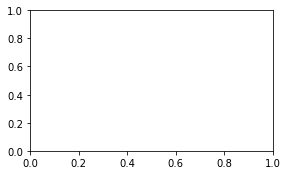

In [113]:
for k in range(len(c_feats)//20 + 1):
    plt.figure(figsize=(20,15))
    for i in range(20*k, 20*(k+1)):
        if i <= len(c_feats)-1:
            plt.subplot(5,4,i+1-20*k)
            sns.distplot(fn_train["c-"+str(i)], label = "train")
            sns.distplot(fn_test["c-"+str(i)], label = "test")
            plt.legend(loc="best")

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

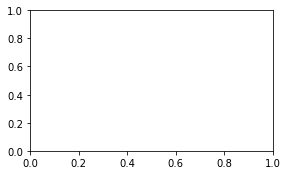

In [114]:
for k in range(len(c_feats)//20 + 1):
    plt.figure(figsize=(20,15))
    for i in range(20*k, 20*(k+1)):
        if i <= len(c_feats)-1:
            plt.subplot(5,4,i+1-20*k)
            sns.distplot(fn_train["g-"+str(i)], label = "train")
            sns.distplot(fn_test["g-"+str(i)], label = "test")
            plt.legend(loc="best")

In [115]:
num = 370
print(len(g_feats))
pca = PCA(n_components=num)
pca.fit(fn_train[g_feats])
print(np.sum(np.array(pca.explained_variance_ratio_)))
plt.figure(figsize=(15,8))
plt.bar(range(num), np.array(pca.explained_variance_ratio_))

772


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [116]:
num = 50
print(len(c_feats))
pca = PCA(n_components=num)
pca.fit(fn_train[c_feats])
print(np.sum(np.array(pca.explained_variance_ratio_)))
plt.figure(figsize=(15,8))
plt.bar(range(num), np.array(pca.explained_variance_ratio_))

100


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

# cp-variables vs c-variables

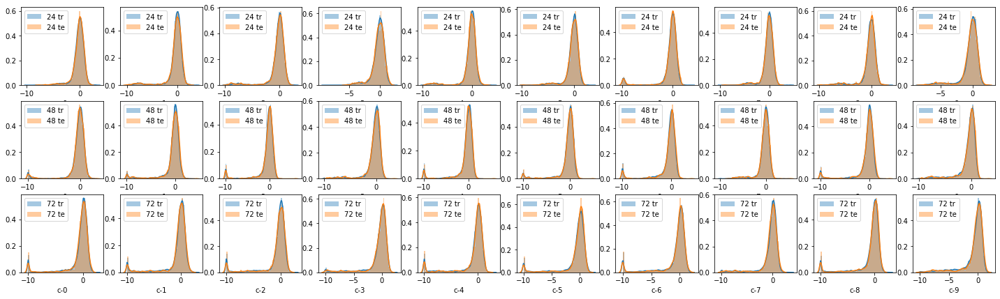

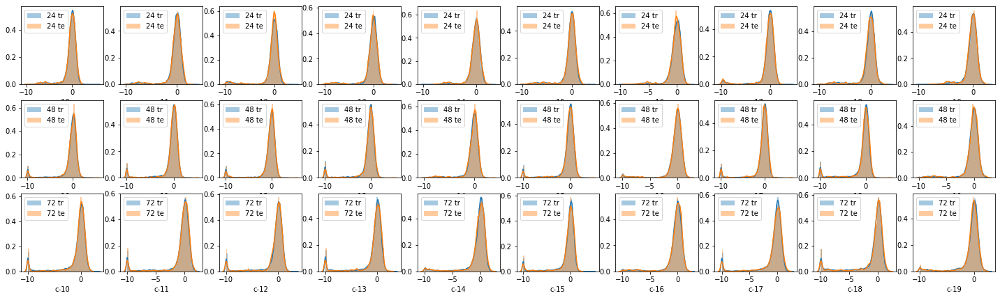

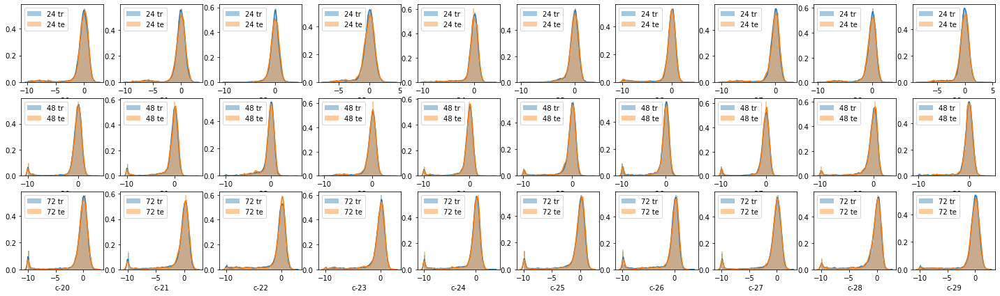

In [117]:
# "cp_time"
size = 10
for k in range(len(c_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(c_feats)-1:
            plt.subplot(3,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_time==24]["c-"+str(i)], label = "24 tr")
            sns.distplot(test_feat[test_feat.cp_time==24]["c-"+str(i)], label = "24 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+size)
            sns.distplot(train_feat[train_feat.cp_time==48]["c-"+str(i)], label = "48 tr")
            sns.distplot(test_feat[test_feat.cp_time==48]["c-"+str(i)], label = "48 te")
            plt.legend(loc="best")
            plt.subplot(3,size,ind+1+2*size)
            sns.distplot(train_feat[train_feat.cp_time==72]["c-"+str(i)], label = "72 tr")
            sns.distplot(test_feat[test_feat.cp_time==72]["c-"+str(i)], label = "72 te")
            plt.legend(loc="best")

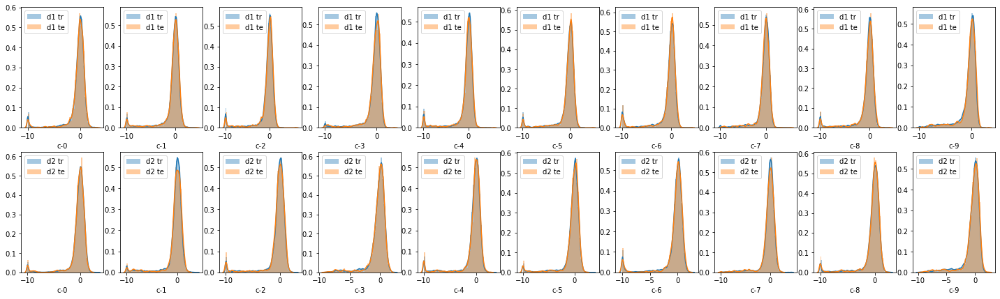

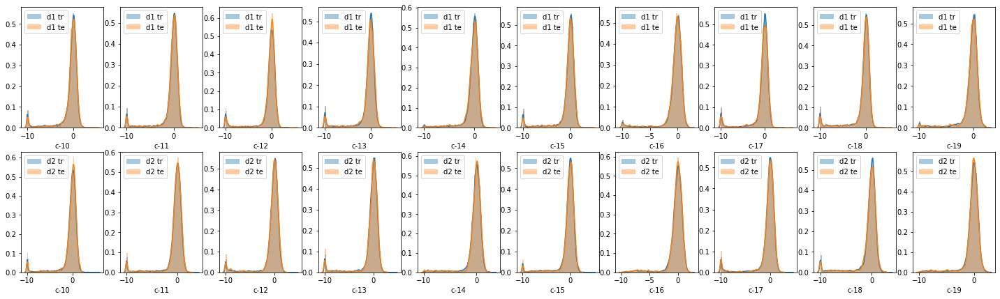

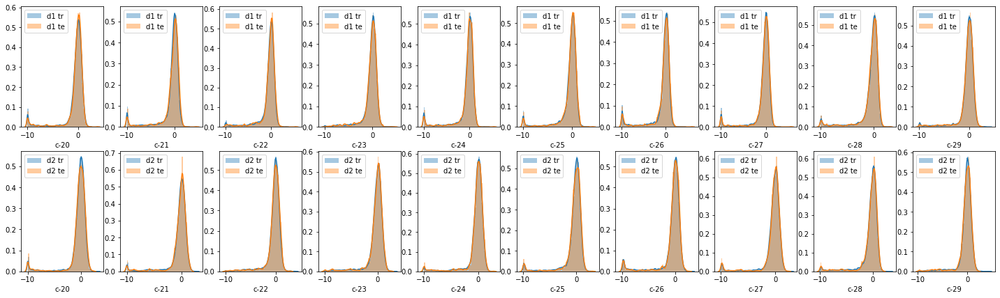

In [118]:
# "cp_dose"
size = 10
for k in range(len(c_feats)//5//size + 1):
    plt.figure(figsize=(25,7))
    for ind, i in enumerate(range(size*k, size*(k+1))):
        if i <= len(c_feats)-1:
            plt.subplot(2,size,ind+1)
            sns.distplot(train_feat[train_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D1"]["c-"+str(i)], label = "d1 te")
            plt.legend(loc="best")
            plt.subplot(2,size,ind+11)
            sns.distplot(train_feat[train_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 tr")
            sns.distplot(test_feat[test_feat.cp_dose=="D2"]["c-"+str(i)], label = "d2 te")
            plt.legend(loc="best")

# g-variables vs c-variables

In [119]:
a_feats = [i for i in train_feat.columns if i in c_feats or i in g_feats]
correlations = train_feat[a_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'].isin(c_feats)]
correlations = correlations[correlations['level_1'].isin(g_feats)]
correlations.tail(20)

,level_0,level_1,0
753865,c-70,g-731,0.838355
753885,c-72,g-349,0.838521
753910,c-73,g-38,0.838720
753915,c-90,g-349,0.838780
753980,c-75,g-328,0.839270
753992,c-42,g-38,0.839408
754196,c-2,g-349,0.841610
754221,c-83,g-349,0.841866
754225,c-13,g-38,0.841954
754313,c-75,g-349,0.842911


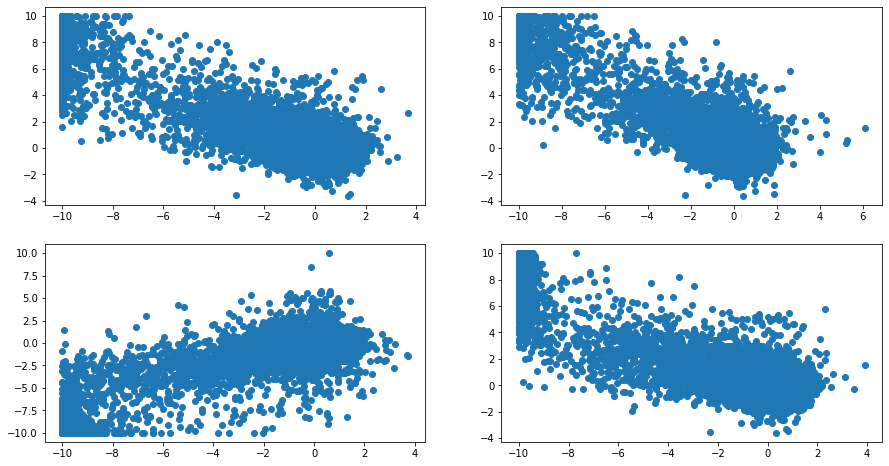

In [120]:
# some correlated examples
plt.figure(figsize=(15,8))
plt.subplot(2,2,1)
plt.scatter(train_feat["c-60"], train_feat["g-349"])
plt.subplot(2,2,2)
plt.scatter(train_feat["c-31"], train_feat["g-349"])
plt.subplot(2,2,3)
plt.scatter(train_feat["c-38"], train_feat["g-228"])
plt.subplot(2,2,4)
plt.scatter(train_feat["c-6"], train_feat["g-349"])

# target info

In [121]:
target_feats = [i for i in train_score.columns if i != "sig_id"]
for i in target_feats:
    print(i, end=", ")

5-alpha_reductase_inhibitor, 11-beta-hsd1_inhibitor, acat_inhibitor, acetylcholine_receptor_agonist, acetylcholine_receptor_antagonist, acetylcholinesterase_inhibitor, adenosine_receptor_agonist, adenosine_receptor_antagonist, adenylyl_cyclase_activator, adrenergic_receptor_agonist, adrenergic_receptor_antagonist, akt_inhibitor, aldehyde_dehydrogenase_inhibitor, alk_inhibitor, ampk_activator, analgesic, androgen_receptor_agonist, androgen_receptor_antagonist, anesthetic_-_local, angiogenesis_inhibitor, angiotensin_receptor_antagonist, anti-inflammatory, antiarrhythmic, antibiotic, anticonvulsant, antifungal, antihistamine, antimalarial, antioxidant, antiprotozoal, antiviral, apoptosis_stimulant, aromatase_inhibitor, atm_kinase_inhibitor, atp-sensitive_potassium_channel_antagonist, atp_synthase_inhibitor, atpase_inhibitor, atr_kinase_inhibitor, aurora_kinase_inhibitor, autotaxin_inhibitor, bacterial_30s_ribosomal_subunit_inhibitor, bacterial_50s_ribosomal_subunit_inhibitor, bacterial_an

In [122]:
# fortunately, one outlier patient showed moa in the two most common targets, so the influence of removing it may be small
#for i in target_feats:
#    if train_score.loc[tmp.index, i].values == 1:
#        print(i)

In [123]:
score_drug[score_drug[target_feats[0]]==1].drug_id.value_counts()

fd3b67efb    6
f222b48dc    6
b7bab2ffc    5
Name: drug_id, dtype: int64

## per column

In [124]:
target_dists = pd.DataFrame(np.sum(train_score[target_feats])).reset_index(drop=False)
target_dists.columns = ["target", "number"]
target_dists.sort_values("number", ascending=False).reset_index(drop=True)

TypeError: '<' not supported between instances of 'numpy.ndarray' and 'str'

In [125]:
target_dists["number"].describe() # ターゲットラベルとしてあるのに、一回も観測されていないターゲットはない

count     207
unique     92
top         6
freq       16
Name: number, dtype: int64

UFuncTypeError: ufunc 'add' did not contain a loop with signature matching types (dtype('<U4521288'), dtype('<U4521288')) -> dtype('<U4521288')

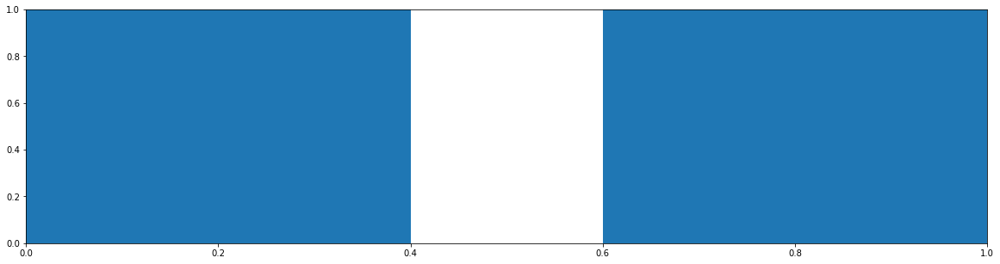

In [126]:
# prediction difficult differs per target 
plt.figure(figsize=(20,5))
plt.bar(range(target_dists.shape[0]), target_dists["number"])

In [127]:
target_dists["suffix"] = target_dists["target"].apply(lambda x: x.split("_")[-1])
target_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False).head(10)

,index,suffix
0,inhibitor,0.541063
1,antagonist,0.154589
2,agonist,0.135266
3,activator,0.024155
4,agent,0.014493
5,blocker,0.009662
6,steroid,0.004831
7,antiviral,0.004831
8,antifungal,0.004831
9,antiarrhythmic,0.004831


[]

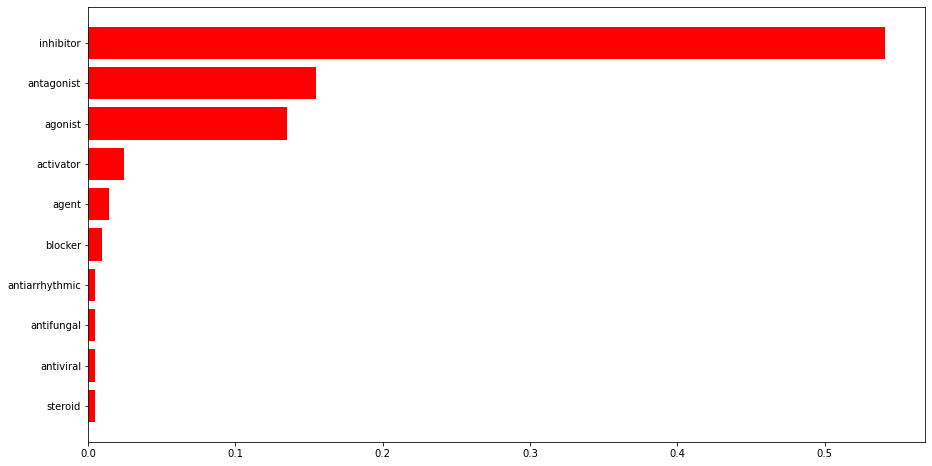

In [128]:
tmp = pd.DataFrame(target_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(10)
tmp = tmp.sort_values("suffix", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["suffix"], color="r")
plt.yticks(range(tmp.shape[0]), tmp["index"], rotation='horizontal')
plt.plot()

In [129]:
target_dists.groupby("suffix")["number"].sum()

suffix
activator                                                          115
agent                                                              150
agonist                                                           2330
analgesic                                                           12
antagonist                                                        3449
anti-inflammatory                                                   73
antiarrhythmic                                                       6
antibiotic                                                          43
anticonvulsant                                                      12
antifolate                                                          36
antifungal                                                          13
antihistamine                                                       12
antimalarial                                                        18
antioxidant                                                         73

In [130]:
tmp = pd.DataFrame(target_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp = tmp.sort_values("number", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["number"])
plt.yticks(range(tmp.shape[0]), tmp["suffix"], rotation='horizontal')
plt.plot()

TypeError: '<' not supported between instances of 'numpy.ndarray' and 'str'

## per row

16844
1    12532
0     7501
2     1538
3      303
4       55
5       13
7        6
Name: score_sum, dtype: int64


KeyError: ''

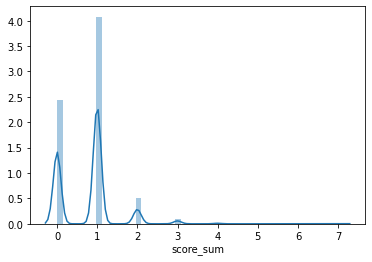

In [131]:
train_score["score_sum"] = pd.DataFrame(np.sum(train_score[target_feats], axis=1))
print(train_score["score_sum"].sum())
print(train_score["score_sum"].value_counts())
sns.distplot(train_score["score_sum"])
train_score[""]

In [132]:
# positive label rate = 0.3%
train_score["score_sum"].sum() * 100 / (len(target_feats) * train_feat.shape[0])

0.37074895515002965

## correlations in target variables

In [133]:
1 / train_score[target_feats].mean(axis=0)

5-alpha_reductase_inhibitor          1291.058824
11-beta-hsd1_inhibitor               1219.333333
acat_inhibitor                        914.500000
acetylcholine_receptor_agonist        115.515789
acetylcholine_receptor_antagonist      72.916944
                                        ...     
vegfr_inhibitor                       129.105882
vitamin_b                             844.153846
vitamin_d_receptor_agonist            562.769231
wnt_inhibitor                         731.600000
target_pair                             0.000000
Length: 207, dtype: float64

In [134]:
train_score[target_feats].corr()

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhibitor,re

In [135]:
correlations = train_score[target_feats].corr().abs()
correlations = (correlations.where(np.triu(np.ones(correlations.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False))
correlations.head(50)

nfkb_inhibitor                     proteasome_inhibitor                  0.921120
kit_inhibitor                      pdgfr_inhibitor                       0.915517
flt3_inhibitor                     kit_inhibitor                         0.757870
                                   pdgfr_inhibitor                       0.704812
aldehyde_dehydrogenase_inhibitor   trpv_agonist                          0.528933
nitric_oxide_production_inhibitor  nrf2_activator                        0.407857
apoptosis_stimulant                caspase_activator                     0.403324
insulin_sensitizer                 ppar_receptor_agonist                 0.402823
norepinephrine_reuptake_inhibitor  serotonin_reuptake_inhibitor          0.341479
fgfr_inhibitor                     vegfr_inhibitor                       0.333715
caspase_activator                  hiv_inhibitor                         0.332375
ikk_inhibitor                      nitric_oxide_production_inhibitor     0.315665
bcl_inhibitor   

In [136]:
correlations[correlations>0.1].shape

(69,)

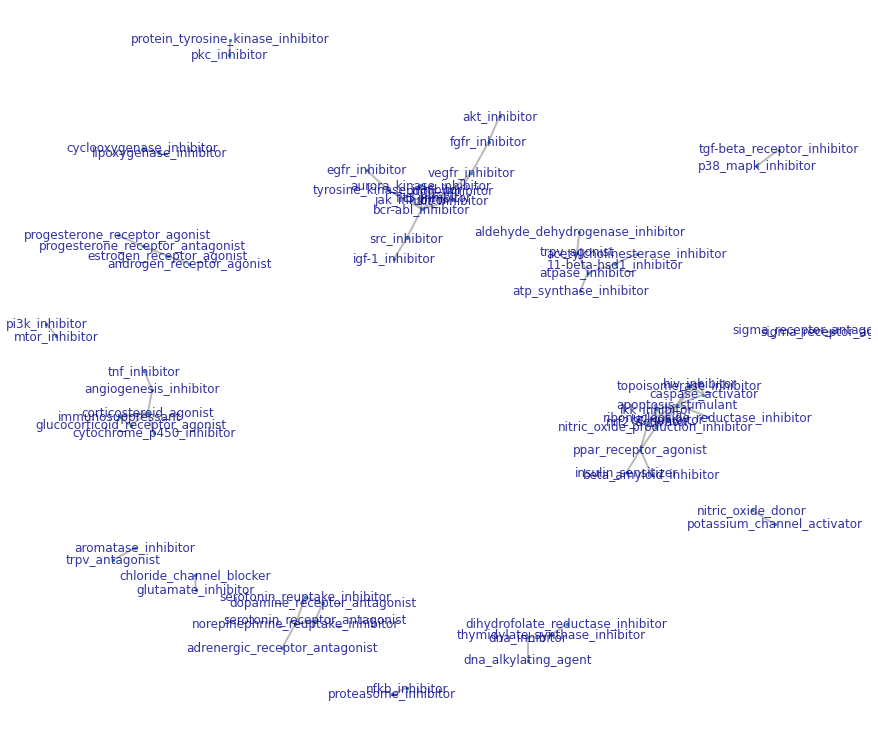

In [137]:
# https://www.kaggle.com/jpmiller/finding-patterns-in-the-scored-targets
import networkx as nx

pairs_df = (1-correlations).reset_index()
G = nx.from_pandas_edgelist(pairs_df[:69], source='level_0', target='level_1', edge_attr=0)

graph_opts = dict(arrows=False,
                  node_size=5,
                  width=2,
                  alpha=0.8,
                  font_size=12,
                  font_color='darkblue',
                  edge_color='darkgray'
                 )

fig= plt.figure(figsize=(12,10))
nx.draw_spring(G, with_labels=True, **graph_opts)

In [138]:
nx.algorithms.community.modularity_max.greedy_modularity_communities(G)

[frozenset({'akt_inhibitor',
            'aurora_kinase_inhibitor',
            'bcr-abl_inhibitor',
            'egfr_inhibitor',
            'fgfr_inhibitor',
            'flt3_inhibitor',
            'igf-1_inhibitor',
            'jak_inhibitor',
            'kit_inhibitor',
            'pdgfr_inhibitor',
            'src_inhibitor',
            'tyrosine_kinase_inhibitor',
            'vegfr_inhibitor'}),
 frozenset({'apoptosis_stimulant',
            'bcl_inhibitor',
            'beta_amyloid_inhibitor',
            'caspase_activator',
            'hiv_inhibitor',
            'ikk_inhibitor',
            'insulin_sensitizer',
            'nitric_oxide_production_inhibitor',
            'nrf2_activator',
            'ppar_receptor_agonist',
            'ribonucleoside_reductase_inhibitor',
            'topoisomerase_inhibitor'}),
 frozenset({'angiogenesis_inhibitor',
            'corticosteroid_agonist',
            'cytochrome_p450_inhibitor',
            'glucocorticoid_recepto

In [139]:
train_targets_scored = pd.read_csv("../input/lish-moa/train_targets_scored.csv")
train_targets_nonscored = pd.read_csv("../input/lish-moa/train_targets_nonscored.csv")
train_features = pd.read_csv("../input/lish-moa/train_features.csv")
# Group targets
target_scored = train_targets_scored.drop("sig_id",axis=1)
target_notscored= train_targets_nonscored.drop("sig_id",axis=1)

target = pd.concat([target_scored,target_notscored],axis=1)
target = target.loc[:,target.sum()>0]

commun = target_scored.T@target_scored

In [140]:
# https://www.kaggle.com/jpmiller/finding-patterns-in-the-scored-targets
import networkx as nx
G = nx.from_pandas_adjacency(commun,create_using=nx.DiGraph)

In [141]:
count = 0
for i in nx.algorithms.community.modularity_max.greedy_modularity_communities(G):
    count += len(i)
    print(len(i))
print(count)

96
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
206


# auxiliary training data

In [142]:
cons_feats = [i for i in train_nonscore.columns if i != "sig_id"]

In [143]:
for i in cons_feats:
    if train_nonscore.loc[tmp.index, i].values == 1:
        print(i)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [144]:
correlations = train_nonscore[cons_feats].corr().abs()
correlations = (correlations.where(np.triu(np.ones(correlations.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False))
correlations.tail(20)

antiseptic                                 fungal_ergosterol_inhibitor                  0.000112
                                           tryptophan_hydroxylase_inhibitor             0.000112
farnesyl_pyrophosphate_synthase_inhibitor  srebp_inhibitor                              0.000102
                                           mrp_inhibitor                                0.000102
growth_factor_receptor_inhibitor           srebp_inhibitor                              0.000102
                                           mrp_inhibitor                                0.000102
hemoglobin_antagonist                      srebp_inhibitor                              0.000102
                                           mrp_inhibitor                                0.000102
antiseptic                                 srebp_inhibitor                              0.000102
                                           mrp_inhibitor                                0.000102
adenosine_kinase_inhibitor    

In [145]:
correlations[correlations>0.5].shape

(34,)

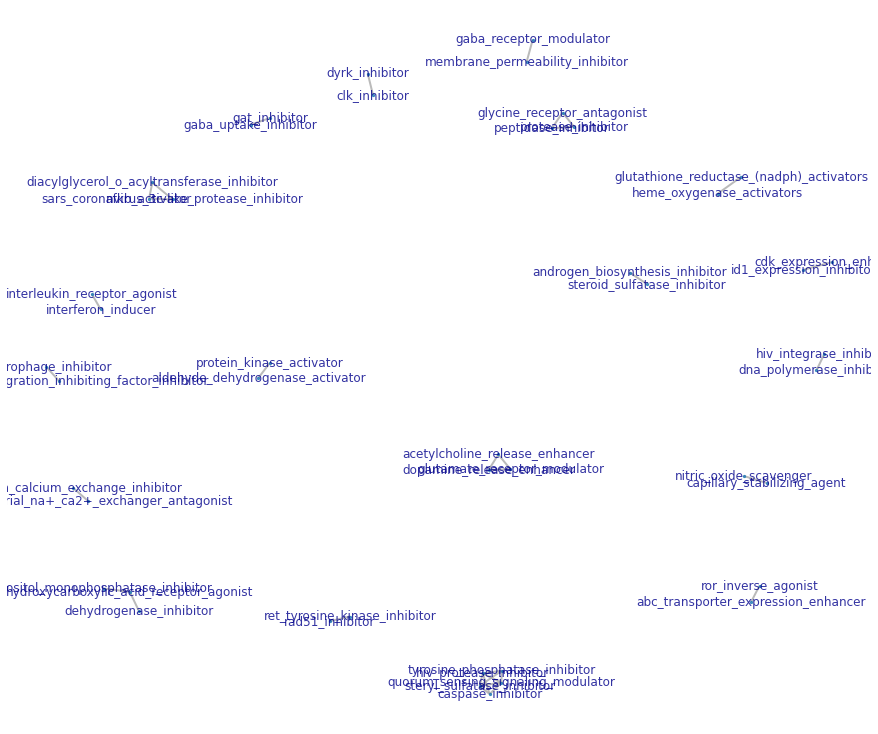

In [146]:
# https://www.kaggle.com/jpmiller/finding-patterns-in-the-scored-targets
import networkx as nx

pairs_df = (correlations).reset_index()
G = nx.from_pandas_edgelist(pairs_df[:34], source='level_0', target='level_1', edge_attr=0)

graph_opts = dict(arrows=False,
                  node_size=5,
                  width=2,
                  alpha=0.8,
                  font_size=12,
                  font_color='darkblue',
                  edge_color='darkgray'
                 )

fig= plt.figure(figsize=(12,10))
nx.draw_spring(G, with_labels=True, **graph_opts)

In [147]:
nx.algorithms.community.modularity_max.greedy_modularity_communities(G)

[frozenset({'caspase_inhibitor',
            'hiv_protease_inhibitor',
            'quorum_sensing_signaling_modulator',
            'steryl_sulfatase_inhibitor',
            'tyrosine_phosphatase_inhibitor'}),
 frozenset({'acetylcholine_release_enhancer',
            'dopamine_release_enhancer',
            'glutamate_receptor_modulator'}),
 frozenset({'diacylglycerol_o_acyltransferase_inhibitor',
            'nfkb_activator',
            'sars_coronavirus_3c-like_protease_inhibitor'}),
 frozenset({'glycine_receptor_antagonist',
            'peptidase_inhibitor',
            'protease_inhibitor'}),
 frozenset({'dehydrogenase_inhibitor',
            'hydroxycarboxylic_acid_receptor_agonist',
            'inositol_monophosphatase_inhibitor'}),
 frozenset({'dna_polymerase_inhibitor', 'hiv_integrase_inhibitor'}),
 frozenset({'rad51_inhibitor', 'ret_tyrosine_kinase_inhibitor'}),
 frozenset({'mitochondrial_na+_ca2+_exchanger_antagonist',
            'sodium_calcium_exchange_inhibitor'}),
 f

In [148]:
set(train_nonscore.sig_id.unique()) == set(train_score.sig_id.unique()) # idは完全一致

True

In [149]:
set(train_score.columns) & set(train_nonscore.columns) # id以外の変数はscore.csvとnon-score.csvで異なる

{'sig_id'}

## per column

In [150]:
nontarget_dists = pd.DataFrame(np.sum(train_nonscore[cons_feats])).reset_index(drop=False)
nontarget_dists.columns = ["target", "number"]
nontarget_dists = nontarget_dists.sort_values("number", ascending=False).reset_index(drop=True)

In [151]:
len(cons_feats)

402

In [152]:
print(nontarget_dists[nontarget_dists.number==0].shape)
print(nontarget_dists[nontarget_dists.number==1].shape)
print(nontarget_dists[nontarget_dists.number==2].shape)
print(nontarget_dists[nontarget_dists.number==3].shape)
print(nontarget_dists[nontarget_dists.number==4].shape)
print(nontarget_dists[nontarget_dists.number==5].shape)
print(nontarget_dists[nontarget_dists.number==6].shape)

(71, 2)
(4, 2)
(1, 2)
(0, 2)
(0, 2)
(2, 2)
(119, 2)


In [153]:
np.transpose(nontarget_dists.tail(200))

,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401
target,contrast_agent,fungal_lanosterol_demethylase_inhibitor,carnitine_palmitoyltransferase_inhibitor,omega_3_fatty_acid_stimulant,ubiquitin-conjugating_enzyme_inhibitor,bronchodilator,tryptophan_hydroxylase_inhibitor,vasoconstrictor,androgen_biosynthesis_inhibitor,ve-cadherin_antagonist,tyrosine_hydroxylase_inhibitor,porcupine_inhibitor,ampk_inhibitor,penicillin_binding_protein_inhibitor,peptidase_inhibitor,acetylcholine_release_enhancer,adenylyl_cyclase_inhibitor,uricase_inhibitor,bile_acid,aldehyde_dehydrogenase_activator,pka_inhibitor,p53_inhibitor,botulin_neurotoxin_inhibitor,wdr5_mll_interaction_inhibitor,phospholipase_activator,antispasmodic,triacylglycerol_lipase_inhibitor,aspartic_protease_inhibitor,thrombopoietin_receptor_agonist,testosterone_receptor_antagonist,telomerase_inhibitor,antipruritic,t_cell_inhibitor,serotonin_release_inhibitor,ap_inhibitor,anxiolytic,smoothened_receptor_agonist,sodium_calcium_exchange_inhibitor,structural_glycoprotein_antagonist,sodium_channel_activator,sodium_channel_blocker,steryl_sulfatase_inhibitor,antirheumatic_drug,ror_inverse_agonist,ribosomal_protein_inhibitor,bacterial_permeability_inducer,atherogenesis_inhibitor,bacterial_atpase_inhibitor,steroid_sulfatase_inhibitor,topical_sunscreen_agent,protein_kinase_activator,autophagy_inducer,atp_citrase_lyase_inhibitor,atp_channel_blocker,quorum_sensing_signaling_modulator,thyrotropin_releasing_hormone_receptor_agonist,rad51_inhibitor,thyroid_hormone_stimulant,atp-sensitive_potassium_channel_inhibitor,atp-sensitive_potassium_channel_agonist,atherosclerosis_formation_inhibitor,ret_tyrosine_kinase_inhibitor,trace_amine_associated_receptor_agonist,ephrin_inhibitor,hiv_integrase_inhibitor,differentiation_inducer,haemostatic_agent,heme_oxygenase_activators,hexokinase_inhibitor,cytidine_deaminase_inhibitor,histamine_release_inhibitor,hiv_protease_inhibitor,hydroxycarboxylic_acid_receptor_agonist,id1_expression_inhibitor,corticosteroid_antagonist,interleukin_receptor_agonist,ion_channel_antagonist,ip1_prostacyclin_receptor_agonist,keap1_ligand,clk_inhibitor,lactate_dehydrogenase_inhibitor,guanylyl_cyclase_activator,gtpase_inhibitor,leukocyte_elastase_inhibitor,dihydropyrimidine_dehydrogenase_inhibitor,enkephalinase_inhibitor,fatty_acid_receptor_antagonist,folate_receptor_ligand,fungal_ergosterol_inhibitor,g_protein_signaling_inhibitor,gaba_gated_chloride_channel_blocker,gaba_uptake_inhibitor,dopamine_release_enhancer,dna_synthesis_inhibitor,gli_antagonist,glucagon_receptor_antagonist,dna_polymerase_inhibitor,glutamate_receptor_modulator,glutathione_reductase_(nadph)_activators,glycine_receptor_antagonist,leucyl-trna_synthetase_inhibitor,abc_transporter_expression_enhancer,nitric_oxide_scavenger,mcl1_inhibitor,na_k-atpase_inhibitor,cdk_expression_enhancer,lipoprotein_lipase_activator,mth1_inhibitor,neurotensin_receptor_antagonist,neurotransmitter,motilin_receptor_agonist,mitochondrial_na+_ca2+_exchanger_antagonist,mitochondrial_inhibitor,niemann-pick_c1-like_1_protein_antagonist,ceramidase_inhibitor,mer_tyrosine_kinase_inhibitor,nociceptin_orphanin_fq_(nop)_receptor_antagonist,cc_chemokine_receptor_agonist,lymphocyte_inhibitor,epoxide_hydolase_inhibitor,map_k

In [154]:
nontarget_dists["suffix"] = nontarget_dists["target"].apply(lambda x: x.split("_")[-1])
nontarget_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False).head(10)

,index,suffix
0,inhibitor,0.524876
1,antagonist,0.109453
2,agonist,0.089552
3,activator,0.054726
4,agent,0.032338
5,stimulant,0.019900
6,enhancer,0.014925
7,inducer,0.014925
8,modulator,0.012438
9,ligand,0.012438


[]

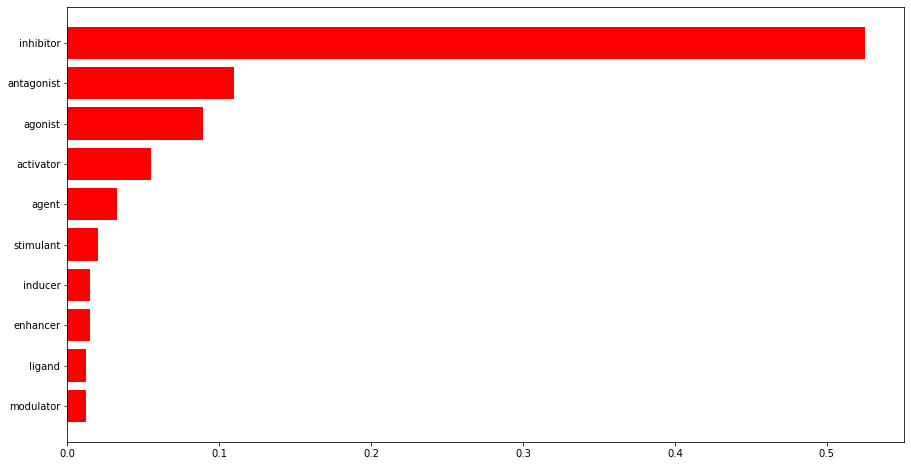

In [155]:
tmp = pd.DataFrame(nontarget_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(10)
tmp = tmp.sort_values("suffix", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["suffix"], color="r")
plt.yticks(range(tmp.shape[0]), tmp["index"], rotation='horizontal')
plt.plot()

In [156]:
nontarget_dists.groupby("suffix")["number"].sum()

suffix
(serm)                30
(ssri)                36
acid                   6
activator            190
activators            12
agent                153
agonist              404
analog                13
anesthetic             0
antacid               12
antagonist           562
anthelmintic          24
antidepressant        30
antiepileptic         24
antihypertensive       0
antimetabolite         0
antipruritic           6
antiseptic             1
antispasmodic          6
antitussive           30
anxiolytic             6
blocker               48
bronchodilator         6
carcinogen            42
diuretic              19
drug                  24
enhancer              24
estrogen               0
glycoside              0
hormone               29
immunostimulant       36
inducer               66
inhibitor           2876
k                      6
ligand                24
modulator             59
mucolytic              0
neurotransmitter       6
precursor             12
progestin         

[]

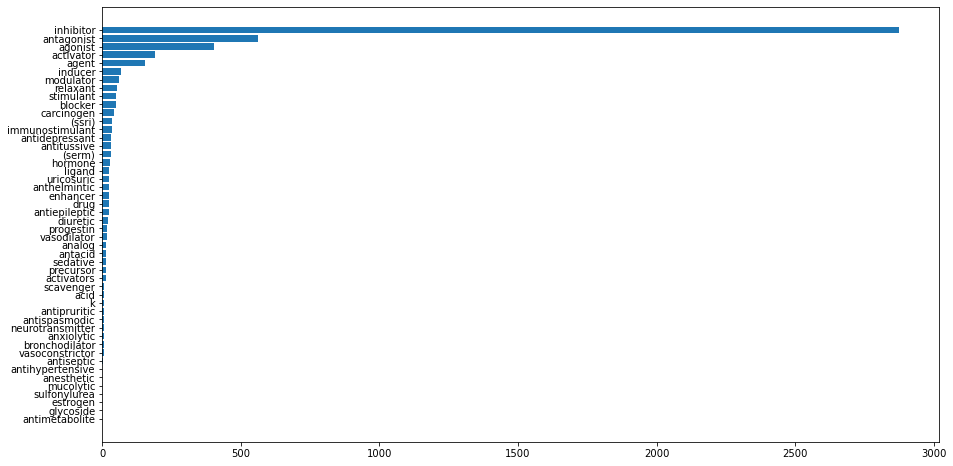

In [157]:
tmp = pd.DataFrame(nontarget_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp = tmp.sort_values("number", ascending=True).reset_index(drop=True)
plt.figure(figsize=(15,8))
plt.barh(range(tmp.shape[0]),tmp["number"])
plt.yticks(range(tmp.shape[0]), tmp["suffix"], rotation='horizontal')
plt.plot()

In [158]:
nontarget_dists.describe()

,number
count,402.000000
mean,12.457711
std,13.359389
min,0.000000
25%,6.000000
50%,7.000000
75%,18.000000
max,91.000000


[]

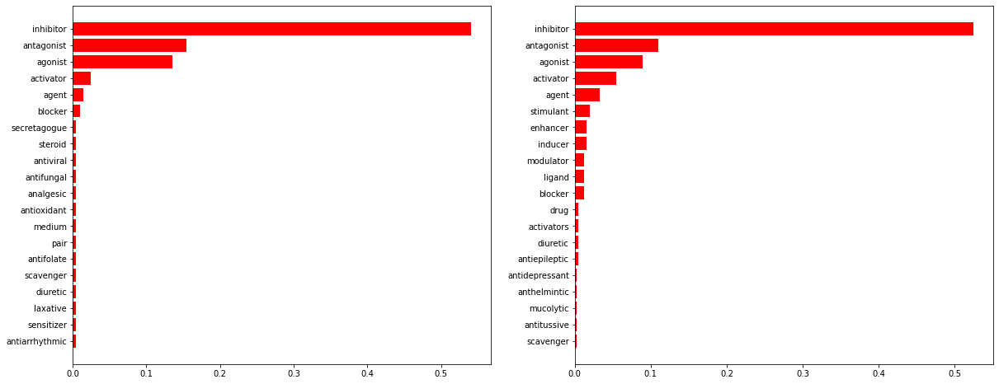

In [159]:
# comparison of ratio of suffix
tmp1 = pd.DataFrame(target_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(20)
tmp1 = tmp1.sort_values("suffix", ascending=True).reset_index(drop=True)

tmp2 = pd.DataFrame(nontarget_dists["suffix"].value_counts(sort=True, normalize=True).reset_index(drop=False)).head(20)
tmp2 = tmp2.sort_values("suffix", ascending=True).reset_index(drop=True)

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.barh(range(tmp1.shape[0]),tmp1["suffix"],color="red")
plt.yticks(range(tmp1.shape[0]), tmp1["index"], rotation='horizontal')
plt.plot()
plt.subplot(1,2,2)
plt.barh(range(tmp2.shape[0]),tmp2["suffix"],color="red")
plt.yticks(range(tmp2.shape[0]), tmp2["index"], rotation='horizontal')
plt.plot()

In [160]:
# comparison of sum of suffix
tmp1 = pd.DataFrame(target_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp1 = tmp1.sort_values("number", ascending=True).reset_index(drop=True).tail(20)

tmp2 = pd.DataFrame(nontarget_dists.groupby("suffix")["number"].sum()).reset_index(drop=False)
tmp2 = tmp2.sort_values("number", ascending=True).reset_index(drop=True).tail(20)

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
plt.barh(range(tmp1.shape[0]),tmp1["number"])
plt.yticks(range(tmp1.shape[0]), tmp1["suffix"], rotation='horizontal')
plt.plot()
plt.subplot(1,2,2)
plt.barh(range(tmp2.shape[0]),tmp2["number"])
plt.yticks(range(tmp2.shape[0]), tmp2["suffix"], rotation='horizontal')
plt.plot()

TypeError: '<' not supported between instances of 'numpy.ndarray' and 'str'

## per row

5008
0    17358
1     4282
2      247
3       36
4       13
7        6
5        6
Name: nonscore_sum, dtype: int64


(array([1.7358e+04, 4.2820e+03, 2.4700e+02, 0.0000e+00, 3.6000e+01,
        1.3000e+01, 0.0000e+00, 6.0000e+00, 0.0000e+00, 6.0000e+00]),
 array([0. , 0.7, 1.4, 2.1, 2.8, 3.5, 4.2, 4.9, 5.6, 6.3, 7. ]),
 <a list of 10 Patch objects>)

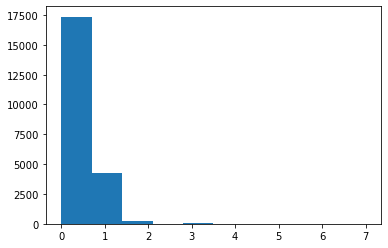

In [161]:
train_nonscore["nonscore_sum"] = pd.DataFrame(np.sum(train_nonscore[cons_feats], axis=1))
print(train_nonscore["nonscore_sum"].sum())
print(train_nonscore["nonscore_sum"].value_counts())
plt.hist(train_nonscore["nonscore_sum"])

In [162]:
train_nonscore["nonscore_sum"].sum() * 100 / (len(cons_feats) * train_nonscore.shape[0])

0.056760121390496035

In [163]:
all_moa_info = pd.merge(train_score, train_nonscore, on="sig_id", how="outer")

In [164]:
all_moa_info[["score_sum","nonscore_sum"]].corr() # weak negative correlation

,score_sum,nonscore_sum
score_sum,1.000000,-0.308418
nonscore_sum,-0.308418,1.000000


In [165]:
pd.crosstab(all_moa_info["score_sum"], all_moa_info["nonscore_sum"])

nonscore_sum,0,1,2,3,4,5,7
score_sum,,,,,,,
0,3664,3680,150,6,1,0,0
1,11956,479,79,12,6,0,0
2,1428,86,12,0,6,6,0
3,279,18,6,0,0,0,0
4,31,6,0,12,0,0,6
5,0,13,0,0,0,0,0
7,0,0,0,6,0,0,0


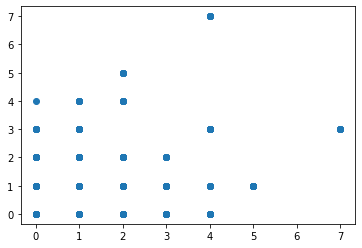

In [166]:
plt.scatter(all_moa_info[["score_sum"]], all_moa_info[["nonscore_sum"]])

# combined training data

In [167]:
def std_calc(row):
    return np.std(row[g_feats])

def mean_calc(row):
    return np.mean(row[g_feats])

tqdm_notebook.pandas(desc="progress")
train_feat[["g_std"]] = train_feat.progress_apply(std_calc, axis=1)
test_feat[["g_std"]] = test_feat.progress_apply(std_calc, axis=1)
train_feat[["g_mean"]] = train_feat.progress_apply(mean_calc, axis=1)
test_feat[["g_mean"]] = test_feat.progress_apply(mean_calc, axis=1)
#print("train", np.max(train_feat["g_unique_num"]), np.min(train_feat["g_unique_num"]))
#print("test ", np.max(test_feat["g_unique_num"]), np.min(test_feat["g_unique_num"]))

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [168]:
def std_calc(row):
    return np.std(row[c_feats])

def mean_calc(row):
    return np.mean(row[c_feats])

tqdm_notebook.pandas(desc="progress")
train_feat[["c_std"]] = train_feat.progress_apply(std_calc, axis=1)
test_feat[["c_std"]] = test_feat.progress_apply(std_calc, axis=1)
train_feat[["c_mean"]] = train_feat.progress_apply(mean_calc, axis=1)
test_feat[["c_mean"]] = test_feat.progress_apply(mean_calc, axis=1)

In [169]:
train = pd.merge(train_feat, train_score, on="sig_id")
train["target_sum"] = train[target_feats].sum(axis=1)
print(train.shape)

(21948, 1091)


In [170]:
train.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,...,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-679,g-680,g-681,g-682,g-683,g-684,g-685,g-686,g-687,g-688,g-689,g-690,g-691,g-692,g-693,g-694,g-695,g-696,g-697,g-698,g-699,g-700,g-701,g-702,g-703,g-704,g-705,g-706,g-707,g-708,g-709,g-710,g-711,g-712,g-713,g-714,g-715,g-716,g-717,g-718,g-719,g-720,g-721,g-722,g-723,g-724,g-725,g-726,g-727,g-728,g-729,g-730,g-731,g-732,g-733,g-734,g-735,g-736,g-737,g-738,g-739,g-740,g-741,g-742,g-743,g-744,g-745,g-746,g-747,g-748,g-749,g-750,g-751,g-752,g-753,g-754,g-755,g-756,g-757,g-758,g-759,g-760,g-761,g-762,g-763,g-764,g-765,g-766,g-767,g-768,g-769,

In [171]:
# it's confirmed that control perturbations have no MoAs
train[train.cp_type=="ctl_vehicle"][target_feats].sum().sum()

0.0

In [172]:
# target variables vs explanation variables
all_feats = [i for i in train.columns if i != "sig_id"]
correlations = train[all_feats].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'].isin(target_feats)]
correlations = correlations[~correlations['level_1'].isin(target_feats)].reset_index(drop=True)
correlations.tail(20)

,level_0,level_1,0
181466,proteasome_inhibitor,c-14,0.767815
181467,proteasome_inhibitor,c-68,0.770052
181468,proteasome_inhibitor,c-27,0.772269
181469,proteasome_inhibitor,c-61,0.772351
181470,proteasome_inhibitor,c-72,0.772406
181471,proteasome_inhibitor,c-90,0.774141
181472,proteasome_inhibitor,c-17,0.778975
181473,proteasome_inhibitor,c-93,0.780356
181474,proteasome_inhibitor,c-35,0.782141
181475,proteasome_inhibitor,c-44,0.782305


In [173]:
correlations.head(20)

,level_0,level_1,0
0,beta_amyloid_inhibitor,g-217,3.928972e-08
1,acat_inhibitor,g-255,1.142334e-07
2,benzodiazepine_receptor_agonist,g-481,3.948857e-07
3,beta_amyloid_inhibitor,g-345,4.094129e-07
4,hcv_inhibitor,g-373,4.442083e-07
5,cck_receptor_antagonist,g-253,4.911229e-07
6,antihistamine,g-23,5.000695e-07
7,insulin_secretagogue,g-251,5.217303e-07
8,potassium_channel_activator,g-649,5.558960e-07
9,analgesic,c-58,5.720282e-07


# all targets

In [174]:
all_targets = pd.merge(train_score, train_nonscore, on="sig_id", how="outer")
print(all_targets.shape)

(21948, 612)


In [175]:
all_feats = [i for i in all_targets.columns if i != "sig_id"]
correlations = all_targets[all_feats].corr().abs()
correlations = (correlations.where(np.triu(np.ones(correlations.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False))

In [176]:
correlations[correlations>0.4].shape

(99,)

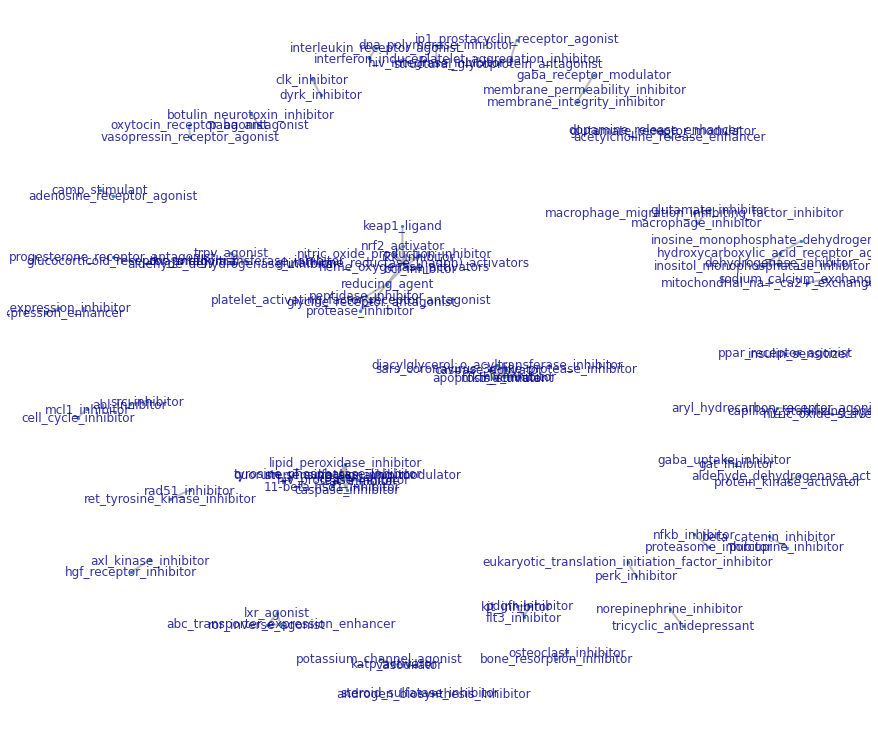

In [177]:
# https://www.kaggle.com/jpmiller/finding-patterns-in-the-scored-targets
import networkx as nx

pairs_df = (correlations).reset_index()
G = nx.from_pandas_edgelist(pairs_df[:99], source='level_0', target='level_1', edge_attr=0)

graph_opts = dict(arrows=False,
                  node_size=5,
                  width=2,
                  alpha=0.8,
                  font_size=12,
                  font_color='darkblue',
                  edge_color='darkgray'
                 )

fig= plt.figure(figsize=(12,10))
nx.draw_spring(G, with_labels=True, **graph_opts)

In [178]:
nx.algorithms.community.modularity_max.greedy_modularity_communities(G)

[frozenset({'bcl_inhibitor',
            'glutathione_reductase_(nadph)_activators',
            'glycine_receptor_antagonist',
            'heme_oxygenase_activators',
            'ikk_inhibitor',
            'keap1_ligand',
            'nitric_oxide_production_inhibitor',
            'nrf2_activator',
            'peptidase_inhibitor',
            'platelet_activating_factor_receptor_antagonist',
            'protease_inhibitor',
            'reducing_agent'}),
 frozenset({'11-beta-hsd1_inhibitor',
            'caspase_inhibitor',
            'hiv_protease_inhibitor',
            'lipid_peroxidase_inhibitor',
            'quorum_sensing_signaling_modulator',
            'stat_inhibitor',
            'steryl_sulfatase_inhibitor',
            'tyrosine_phosphatase_inhibitor'}),
 frozenset({'apoptosis_stimulant',
            'caspase_activator',
            'diacylglycerol_o_acyltransferase_inhibitor',
            'hiv_inhibitor',
            'nfkb_activator',
            'sars_coronavi

# can we predict sum of moa?

In [179]:
from sklearn import preprocessing
categoricals = ["cp_type", "cp_dose"]

def encoding(tr, te):
    for f in categoricals:
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(tr[f]))
        tr[f] = lbl.transform(list(tr[f]))
        te[f] = lbl.transform(list(te[f])) 
        
    return tr, te

train_feat, test_feat = encoding(train_feat, test_feat)
n_train = train_feat.copy().drop("sig_id", axis=1)
n_test = test_feat.copy().drop("sig_id", axis=1)

In [180]:
train_score["score_sum"] = pd.DataFrame(np.sum(train_score[target_feats], axis=1))
n_train["score_sum"] = train_score["score_sum"].apply(lambda x: 1 if x >=1 else 0)

In [181]:
def calc10(row):
    return sum(np.array(row[g_feats+c_feats].values)==10)

def calc_10(row):
    return sum(np.array(row[g_feats+c_feats].values)==-10)

g_feats = [i for i in n_train.columns if "g-" in i]
c_feats = [i for i in n_train.columns if "c-" in i]
tqdm_notebook.pandas(desc="progress")
n_train["10_num"] = train_feat.progress_apply(calc10, axis=1)
n_train["m10_num"] = train_feat.progress_apply(calc_10, axis=1)

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [182]:
n_train["gc_ext"] = n_train["10_num"] + n_train["m10_num"]

In [183]:
#def calc10(row):
#    return sum(np.array(row[g_feats].values)==10)

#def calc_10(row):
#    return sum(np.array(row[g_feats].values)==-10)

#n_train["c10_num"] = train_feat.progress_apply(calc10, axis=1)
#n_train["cm10_num"] = train_feat.progress_apply(calc_10, axis=1)

In [184]:
n_train.shape

(21948, 885)

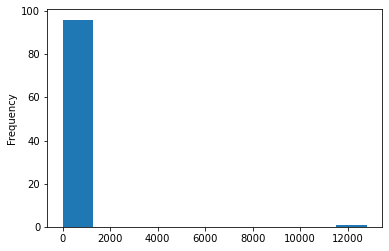

In [185]:
n_train[n_train.score_sum!=0]["gc_ext"].value_counts().plot(kind="hist")

In [186]:
n_train[n_train.score_sum!=0]["gc_ext"].mean(), n_train[n_train.score_sum==0]["gc_ext"].mean()

(2.0033917076209593, 0.26276496467137717)

In [187]:
n_train[n_train.score_sum!=0]["gc_ext"].std(), n_train[n_train.score_sum==0]["gc_ext"].std()

(9.854559246095903, 2.494930600360999)

In [188]:
n_train[n_train.score_sum!=0]["gc_ext"].max(), n_train[n_train.score_sum==0]["gc_ext"].max()

(416, 63)

In [189]:
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
def modelling_lgb(new_train, target):
    
    y_train = new_train[target].copy()
    X_train = new_train.copy().drop([target]+["pred"], axis=1)

    params = {'objective': 'binary', "pos_weight": 0.5,
              'boosting_type': 'gbdt', 'tree_learner': 'serial', 'learning_rate': 0.1, 
               "num_leaves": 10, 'random_seed':44, 'max_depth': 4} 
        
    n_folds=4
    skf=StratifiedKFold(n_splits = n_folds, shuffle=True, random_state=0)
    
    valid = np.zeros([X_train.shape[0]])
    for i , (train_index, test_index) in enumerate(skf.split(X_train, y_train)):
        X_train2 = X_train.iloc[train_index,:]
        y_train2 = y_train.iloc[train_index]

        X_valid2 = X_train.iloc[test_index,:]
        y_valid2 = y_train.iloc[test_index]
        
        lgb_train = lgb.Dataset(X_train2, y_train2)
        lgb_eval = lgb.Dataset(X_valid2, y_valid2, reference=lgb_train)
        
        clf = lgb.train(params, lgb_train,valid_sets=[lgb_train, lgb_eval], 
               num_boost_round=10000,early_stopping_rounds=10,verbose_eval = 100) 

        valid_predict = clf.predict(X_valid2, num_iteration = clf.best_iteration)
        valid[test_index] = valid_predict
            
    #score = np.sqrt(log_loss(y_train, valid))
    #print(score)
            
    return valid

valid = modelling_lgb(n_train, "score_sum")

KeyError: "['pred'] not found in axis"

In [190]:
n_train["pred"] = valid

NameError: name 'valid' is not defined

In [191]:
n_train[n_train.pred>0.8]["score_sum"].value_counts()

AttributeError: 'DataFrame' object has no attribute 'pred'

In [192]:
import optuna

def optuna_check(new_train, target_train, target, params):
    
    X_train = new_train.copy() #.drop(['sig_id'],axis=1).copy()
    y_train = target_train[target].copy()
        
    n_folds=4
    skf=StratifiedKFold(n_splits = n_folds, shuffle=True, random_state=0)

    valid = np.zeros([X_train.shape[0]])
    for i , (train_index, test_index) in enumerate(skf.split(X_train, y_train)):
        print("Fold "+str(i+1))
        X_train2 = X_train.iloc[train_index,:]
        y_train2 = y_train.iloc[train_index]

        X_valid2 = X_train.iloc[test_index,:]
        y_valid2 = y_train.iloc[test_index]
        
        lgb_train = lgb.Dataset(X_train2, y_train2)
        lgb_eval = lgb.Dataset(X_valid2, y_valid2, reference=lgb_train)
        
        clf = lgb.train(params, lgb_train,valid_sets=[lgb_train, lgb_eval], 
               num_boost_round=10000,early_stopping_rounds=50,verbose_eval = 1000) 

        valid_predict = clf.predict(X_valid2, num_iteration = clf.best_iteration)
        valid[test_index] = valid_predict

    score = mean_squared_error(y_train, valid)
            
    return score


def objective(trial):
    
    params = {
        'objective': 'regression',
        'metric': 'rmse',
        'boosting_type': 'gbdt',
        'boost_from_average': True,
        'num_threads': 4,
        'random_state': 42,
        'learning_rate': 0.01,
        
        'num_leaves': trial.suggest_int('num_leaves', 10, 50),
        #'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 10, 200),
        #'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 0.1),
        'max_depth': trial.suggest_int('max_depth', 1, 5),
        #'bagging_fraction': trial.suggest_loguniform('bagging_fraction', .5, .99),
        #'feature_fraction': trial.suggest_loguniform('feature_fraction', .5, .99),
        #'lambda_l1': trial.suggest_loguniform('lambda_l1', 0.1, 2),
        #'lambda_l2': trial.suggest_loguniform('lambda_l2', 0.1, 2)
    }
    
    score = optuna_check(train_feat, train_score, "score_sum", params)
    
    return score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

Fold 1


[W 2021-03-17 13:17:40,324] Trial 0 failed because of the following error: ValueError('DataFrame.dtypes for data must be int, float or bool.\nDid not expect the data types in the following fields: sig_id')
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/optuna/study.py", line 709, in _run_trial
    result = func(trial)
  File "<ipython-input-192-dd179aa4ec42>", line 55, in objective
    score = optuna_check(train_feat, train_score, "score_sum", params)
  File "<ipython-input-192-dd179aa4ec42>", line 24, in optuna_check
    num_boost_round=10000,early_stopping_rounds=50,verbose_eval = 1000)
  File "/opt/conda/lib/python3.7/site-packages/lightgbm/engine.py", line 228, in train
    booster = Booster(params=params, train_set=train_set)
  File "/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py", line 1714, in __init__
    train_set.construct().handle,
  File "/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py", line 1085, in construct
    categ

ValueError: DataFrame.dtypes for data must be int, float or bool.
Did not expect the data types in the following fields: sig_id

# check pytorch method

In [193]:
from sklearn.feature_selection import VarianceThreshold
X = train_feat.iloc[:,4:].copy().values
select = VarianceThreshold(threshold=0.78)
X_new = select.fit_transform(X)
drop_feats = list(np.array(train_feat.iloc[:,4:].columns)[select.get_support()==False])
print(drop_feats, len(drop_feats))

['g-1', 'g-6', 'g-15', 'g-18', 'g-19', 'g-21', 'g-23', 'g-25', 'g-77', 'g-78', 'g-94', 'g-104', 'g-153', 'g-184', 'g-193', 'g-216', 'g-219', 'g-262', 'g-267', 'g-268', 'g-274', 'g-279', 'g-292', 'g-303', 'g-307', 'g-318', 'g-324', 'g-331', 'g-340', 'g-345', 'g-382', 'g-396', 'g-404', 'g-420', 'g-435', 'g-454', 'g-472', 'g-481', 'g-482', 'g-485', 'g-507', 'g-536', 'g-542', 'g-549', 'g-550', 'g-552', 'g-560', 'g-581', 'g-583', 'g-611', 'g-633', 'g-687', 'g-718', 'g-734', 'g-754', 'g-756', 'sum_of_moa', 'g_std', 'g_mean', 'c_std'] 60


In [194]:
from scipy import stats
# 1%: 0.78 60個
# 5%: 0.58 15個
count = 0
different_cols = []
for col in train_feat.columns:
    if col in ['sig_id', 'cp_type', 'cp_time', 'cp_dose']:
        continue
    if stats.ttest_ind(train_feat[col], test_feat[col]).pvalue < 0.01:
        print(col, stats.ttest_ind(train_feat[col], test_feat[col]).pvalue)
        different_cols.append(col)
        count += 1

g-22 9.376718734857535e-05
g-52 0.009316995931499114
g-60 0.0026739405953579826
g-68 0.009625740213446525
g-98 0.00508595698702276
g-101 0.00017859422805573504
g-110 0.006463046282399461
g-120 0.009325148140350533
g-135 0.0001433299195729902
g-211 0.0009180961915720482
g-257 0.0016918386847387774
g-273 0.0007267327805689009
g-332 0.0036977116724254155
g-354 0.0008751987404265968
g-380 0.0011464059370001904
g-392 0.00026477985226063027
g-400 0.006011319323160037
g-410 0.0070503223672236225
g-413 0.0015820533069247564
g-418 0.002653149307633112
g-433 0.006169133005887999
g-440 0.0017498607341290089
g-489 0.0013626647427658317
g-491 0.008723072327305726
g-492 0.00019944707082012996
g-503 0.002399084157499117
g-518 0.004890956602300453
g-526 0.004523224316473382
g-528 0.006842753298221873
g-574 0.0043170378889224445
g-600 0.0012338088305975019
g-628 0.0024614751768627595
g-655 0.006674077363763887
g-656 0.001154713503242742
g-664 0.0039487463356450815
g-700 0.003619437940396749
g-702 0.001

KeyError: 'sum_of_moa'

In [195]:
len(different_cols)

39

In [196]:
set(different_cols) & set(drop_feats)

set()

# summary

- clear correlation in some g-variables, but may be influenced by 10 or -10 values and others have no correlations
- almost all g variables have normal distribution with one peak, but some have second peak and sharp peak
- clear correlation in all c-variables, but may be influenced by minimum value of -10
- clear correlation in target-variables
- even after removing control pertubations data, correlations of g-variables, c-variables and target-variables remain
- only 0.3% of labels become 1 in the training data, so the data are skewed
- almost all exmaples have 0 or 1 positive labels
- some explanatory variables significantly effect target variables
- train_features.csv and train_targets_scored.csv can be connected via sig_id without data loss
- small difference in cp variables between training and test
- small difference in g variables between training and test
- small difference in c variables between training and test
- distribution of all c variables per person look simpler than cases in g-variables. values of g-variables may be clipped if they are larger than 10?
- correlations between c variables and g varibles are also high. 
- some patients have many identical values in g-variable and except an example with 392 unique values, others have at least 681 unique values.
- many identical values in g-variables mean that the exmaple include multiple values of -10 or 10.
- some patients have many identical values in c-variable and the identical values are -10 and they are all negative values.
- labels in auxiliary training data are also unbalanced.
- no missing values in the data
- in terms of interactions in cp variables, there's no significant characteristics.
- traingin data clearly include one outlier in terms of g unique values
- in terms of unique values, no differece between train and test
- In predictions of 2 targets, cross validation can't be utilized. (erbb2_inhibitor, atp-sensitive_potassium_channel_antagonist)
- only one variable explains most variance in terms of c variables
- suffix of target features was visualized. inihibitor is the most frequently used variable.
- difficult targets have at least 100 positive cases.
- examples with little g10_num or g_10_num become positive in difficult variable
- g and c variables groupby cp_time and cp_dose in control group could be calculated and can be applied to data for feature engineering.
- some nonscore target variables can be utilized to predict difficult target variables
- lines without medicine seem to be included in those with medicine? → not necessarily
- weak negative correlation between score targets and nonscore targets
- label relationship could be found by networkx